# Import packages

In [3]:
import numpy as np
import scanpy as sc
import seaborn as sns
import pandas as pd
import re
from anndata import AnnData
import decoupler as dc
from scipy.stats import ttest_ind

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    facecolor="white",
    frameon=False,
)

# Define functions

In [4]:
def patch_plot(patches, ax=None, order='sort', w=0.25, h=0, legend_right=True,
               show_ticks=False):
    cur_patches = pd.Series(patches)

    if order == 'sort':
        order = list(np.sort(cur_patches.index))

    data = pd.Series([1] * len(order), index=order[::-1])
    if ax is None:
        if h == 0:
            h = 0.3 * len(patches)
        _, ax = plt.subplots(figsize=(w, h))

    data.plot(kind='barh', color=[cur_patches[x] for x in data.index], width=1, ax=ax)
    ax.set_xticks([])
    if legend_right:
        ax.yaxis.tick_right()

    sns.despine(offset={'left': -2}, ax=ax)

    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)

    if not show_ticks:
        ax.tick_params(length=0)

    return ax

# Palettes

In [21]:
samples_ordered = ['EOC87_pPer', 'EOC3_pPer', 'EOC204_pMes', 'EOC115_pPer',
                   'EOC153_pOme', 'EOC136_pMes', 'EOC1127_pOme', 'EOC649_pOme', 'EOC372_pPer']

patients_ordered = ['EOC87', 'EOC3', 'EOC204', 'EOC115', # refractory
                    'EOC153', 'EOC136', 'EOC1127', 'EOC649', 'EOC372' # responsive
                   ]

In [22]:
color_mapping_long = {
    'B.cell': '#33658A',
    'Plasma.cell': '#669EC8',
    'T.cell': '#68A691',
    'Myeloid.cell': '#176B27',
    'Erythroid.cell': '#279AF1',
    'Dendritic.cell': '#F3B391',
    'Mast.cell': '#ED5233',
    'Fibroblast': '#9792E3',
    'Ovarian.cancer.cell': '#3D405B',
    'Endothelial.cell': '#C64191',
}

<Axes: >

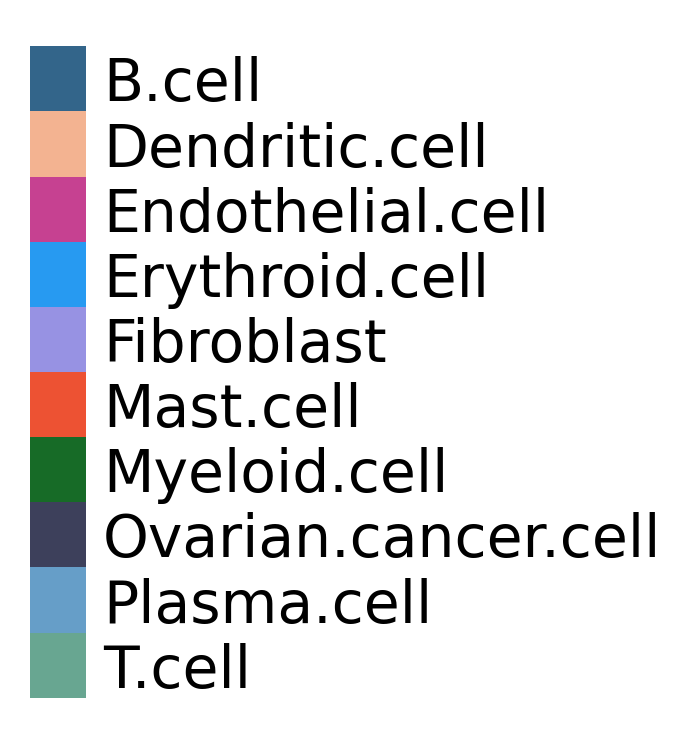

In [23]:
patch_plot(color_mapping_long)

In [24]:
patients_colors_EOC = {
    'EOC3': '#FFDF88',
    'EOC87': '#F1558E',
    'EOC204': '#EBA889',
    'EOC115': '#BC4B51',
    'EOC372': '#5B8E7D',
    'EOC136': '#8A89C0',
    'EOC153': '#0081AF',
    # 'EOC227': '',
    'EOC649': '#A6D49F',
    'EOC1127': '#90BEDE'
}

<Axes: >

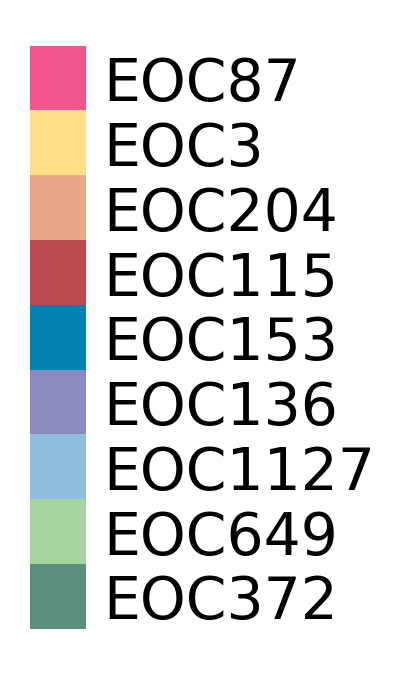

In [25]:
patch_plot(patients_colors_EOC, order=patients_ordered)

In [26]:
color_mapping_short = {
    'cancer': '#F78764',
    'immune': '#68A691',
    'stromal': '#742792'
}

<Axes: >

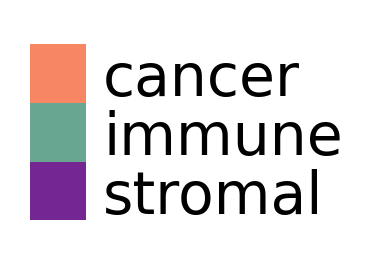

In [27]:
patch_plot(color_mapping_short)

In [28]:
HRD_palette = {
    'HRP': '#81A4CD',
    'HRD': '#FFA047'}

<Axes: >

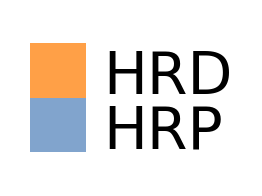

In [29]:
patch_plot(HRD_palette)

In [30]:
tissue_palette = {
    'Mesentary': '#6F9CEB',
    'Omentum': '#5B8C5A',
    'Peritoneum': '#7F2982'
}

<Axes: >

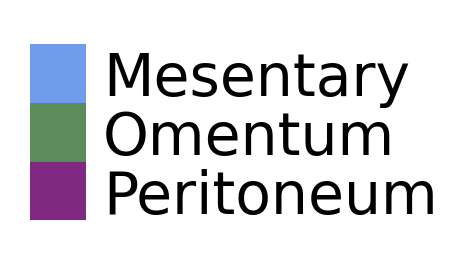

In [31]:
patch_plot(tissue_palette)

In [32]:
status_palette = {'Refractory': '#f28482',
                  'Sensitive': '#81b29a',
                  'Intermediate': '#4280A7'
                 }

In [33]:
status_palette_short = {'R': '#f28482',
                  'S': '#81b29a',
                  'Intermediate': '#4280A7'}

<Axes: >

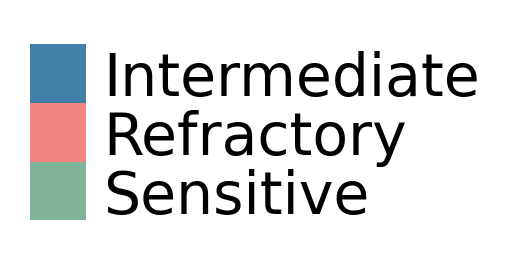

In [34]:
patch_plot(status_palette)

# Annotation

In [35]:
mymeta = pd.read_csv('/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/Anna_SC_data/paper_data/meta_patients.tsv',
            sep='\t', index_col=0)
mymeta

,scRNA_sample,publication_code,Status,SBS3,tissue,Definition
EOC3,EOC3_pPer,EOC3,Refractory,HRP,Peritoneum,R
EOC87,EOC87_pPer,EOC87,Refractory,HRP,Peritoneum,R
EOC204,EOC204_pMes,EOC204,Refractory,HRD,Mesentary,R
EOC115,EOC115_pPer,EOC115,Refractory,HRP,Peritoneum,R
EOC372,EOC372_pPer,EOC372,Sensitive,HRD,Peritoneum,S
EOC136,EOC136_pMes,EOC136,Sensitive,HRD,Mesentary,S
EOC153,EOC153_pOme,EOC153,Sensitive,HRD,Omentum,S
EOC649,EOC649_pOme,EOC649,Sensitive,HRP,Omentum,S
EOC1127,EOC1127_pOme,EOC1127,Sensitive,HRP,Omentum,S


In [36]:
meta = pd.read_csv('/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/Anna_SC_data/paper_data/meta_sample.tsv',
                   sep='\t', index_col=0)
meta.head(3)

,nCount_RNA,nFeature_RNA,log2nCount,log2nFeature,patient,percent.mt,nReads,log2nReads,nCount_SCT,cell_types_v2,NACT,celltype_updated,cell_name.1,scRNA_sample,publication_code,Status,SBS3,tissue,Definition
cell_name,,,,,,,,,,,,,,,,,,,
AAAGATGCAGACGTAG-8,3613,973,11.818982,9.926296,EOC649,2.158871,55379,15.757051,4395,immune,primary,T.cell,AAAGATGCAGACGTAG-8,EOC649_pOme,EOC649,Sensitive,HRP,Omentum,S
AAAGATGTCAGGATCT-8,4037,1621,11.979068,10.662668,EOC649,3.195442,53560,15.708868,4388,immune,primary,T.cell,AAAGATGTCAGGATCT-8,EOC649_pOme,EOC649,Sensitive,HRP,Omentum,S
AAAGCAACACGGTTTA-8,1714,515,10.743151,9.008429,EOC649,2.975496,23059,14.493042,3618,immune,primary,Plasma.cell,AAAGCAACACGGTTTA-8,EOC649_pOme,EOC649,Sensitive,HRP,Omentum,S


In [37]:
meta.shape

(19156, 19)

In [38]:
meta.columns

Index(['nCount_RNA', 'nFeature_RNA', 'log2nCount', 'log2nFeature', 'patient',
       'percent.mt', 'nReads', 'log2nReads', 'nCount_SCT', 'cell_types_v2',
       'NACT', 'celltype_updated', 'cell_name.1', 'scRNA_sample',
       'publication_code', 'Status', 'SBS3', 'tissue', 'Definition'],
      dtype='object')

# Read counts

In [39]:
adata = sc.read_h5ad('/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/Anna_SC_data/paper_data/adata_9patients_without_PCs.h5ad')

In [40]:
adata

AnnData object with n_obs × n_vars = 19156 × 58037
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    layers: 'counts'

## Normalizing the data

In [41]:
# adata_copy = adata.copy()

In [42]:
# Normalizing total counts per cell
print('normalize_total')
sc.pp.normalize_total(
    adata, 
    target_sum=1e4, 
    exclude_highly_expressed=True
)

# Logarithmic transformation
print('log1p')
sc.pp.log1p(adata)

# Identifying highly variable genes
print('highly_variable_genes')
sc.pp.highly_variable_genes(
    adata, 
    flavor='seurat_v3', 
    n_top_genes=2000, 
    subset=False  # Set subset=True to filter the dataset immediately
)

# Save raw data
print('raw')
adata.raw = adata

# Regress out technical effects
print('regress_out')
sc.pp.regress_out(
    adata, 
    ['nCount_RNA', 'percent.mt'], 
    n_jobs=50
)

# Scaling the data
print('scale')
sc.pp.scale(adata, max_value=10)

# Storing normalized data in a layer
adata.layers['normalized'] = adata.X

normalize_total
log1p
highly_variable_genes


/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


raw
regress_out
scale


In [43]:
# Principal Component Analysis (PCA)
print('pca')
sc.tl.pca(
    adata, 
    svd_solver='arpack', 
    use_highly_variable=True, 
    random_state=41
)

# Constructing a neighborhood graph
print('neighbors')
sc.pp.neighbors(
    adata, 
    n_neighbors=15, 
    n_pcs=30, 
    random_state=41
)

# UMAP embedding
print('umap')
sc.tl.umap(
    adata, 
    random_state=41, 
    spread=1., 
    min_dist=0.5
)

pca
neighbors


/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/l

umap


In [45]:
adata

AnnData object with n_obs × n_vars = 19156 × 58037
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

# Markers expression check

In [46]:
# Epithelial cancer cells: WFDC2, PAX8, MUC16
# Stromal cells: COL12A, FGFR1, DCN
# Immune cells: CD14, CD3D, CD79B, CD8A, FCER1G, HLA-DRA, NKG7, PTPRC

In [47]:
mrks = {
    'EOC': ['WFDC2', 'PAX8', 'MUC16'],
    'Stromal': ['COL1A2', 'FGFR1', 'DCN'],
    'Immune': ['CD14', 'CD3D','CD79B', 'CD8A', 'FCER1G', 'HLA-DRA', 'NKG7', 'PTPRC']
}

In [48]:
adata.obs['cell_type_updated'].value_counts()

T.cell                 5576
Ovarian.cancer.cell    5567
Myeloid.cell           4104
Fibroblast             3187
Plasma.cell             336
B.cell                  209
Dendritic.cell           75
Mast.cell                55
Endothelial.cell         47
Name: cell_type_updated, dtype: int64

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


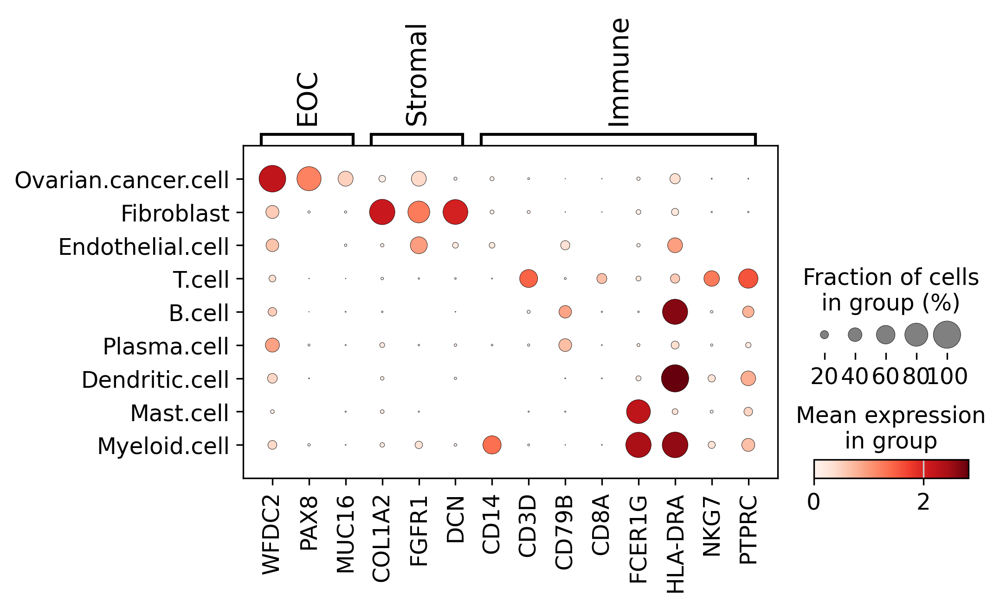

In [58]:
dp = sc.pl.dotplot(adata,
                   mrks,
                   'cell_type_updated',
                   show=False,
                   categories_order=['Ovarian.cancer.cell', 'Fibroblast', 'Endothelial.cell',
                                     'T.cell', 'B.cell', 'Plasma.cell', 'Dendritic.cell',
                                     'Mast.cell', 'Myeloid.cell'], 
                   smallest_dot=0
                  )

# dp['mainplot_ax'].figure.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/sc_dotplot_9patients_annmarkers.pdf",
#                                  dpi=600, bbox_inches='tight')

# QC check

In [59]:
meta.columns

Index(['nCount_RNA', 'nFeature_RNA', 'log2nCount', 'log2nFeature', 'patient',
       'percent.mt', 'nReads', 'log2nReads', 'nCount_SCT', 'cell_types_v2',
       'NACT', 'celltype_updated', 'cell_name.1', 'scRNA_sample',
       'publication_code', 'Status', 'SBS3', 'tissue', 'Definition'],
      dtype='object')

In [60]:
# The percentage of UMI counts originating from mitochondrial gene
#
# < 20 for all cell types -- NEW

meta.groupby('cell_types_v2')['percent.mt'].max() 

cell_types_v2
cancer     19.993894
immune     19.971333
stromal    19.956803
Name: percent.mt, dtype: float64

# UMAP full data

In [61]:
adata.obs.columns

Index(['sample', 'patient_id', 'anatomical_location', 'cell_type',
       'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads',
       'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT',
       'status', 'SBS3', 'cell_id'],
      dtype='object')

In [62]:
sc.set_figure_params(figsize=(10, 8), frameon=False,
                     dpi_save=600, vector_friendly=True)
sc.settings.n_jobs=2

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


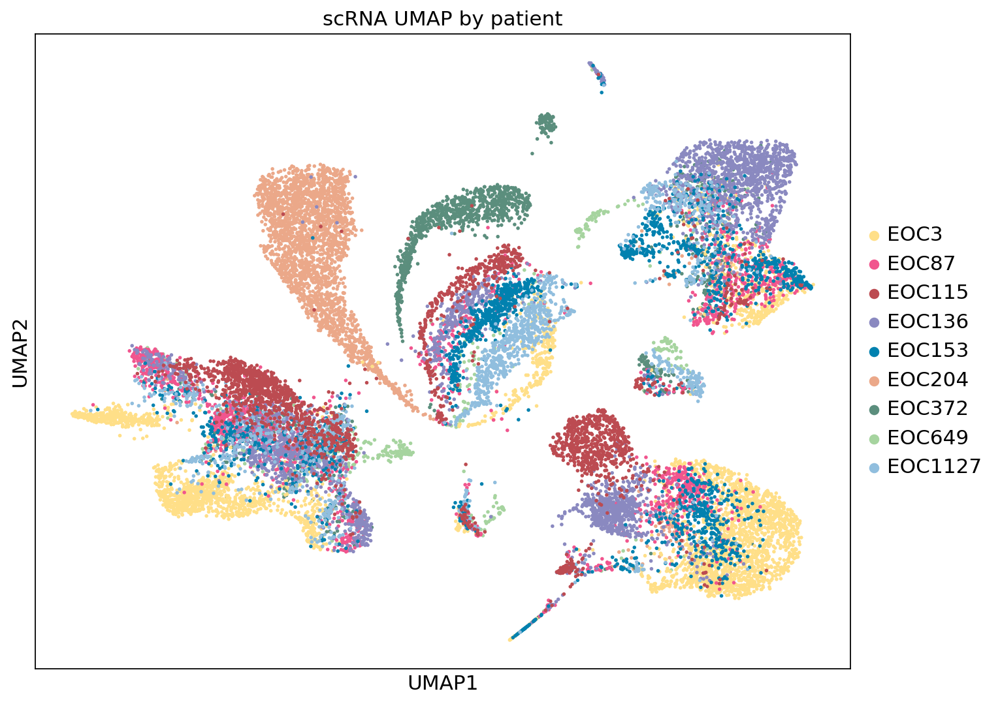

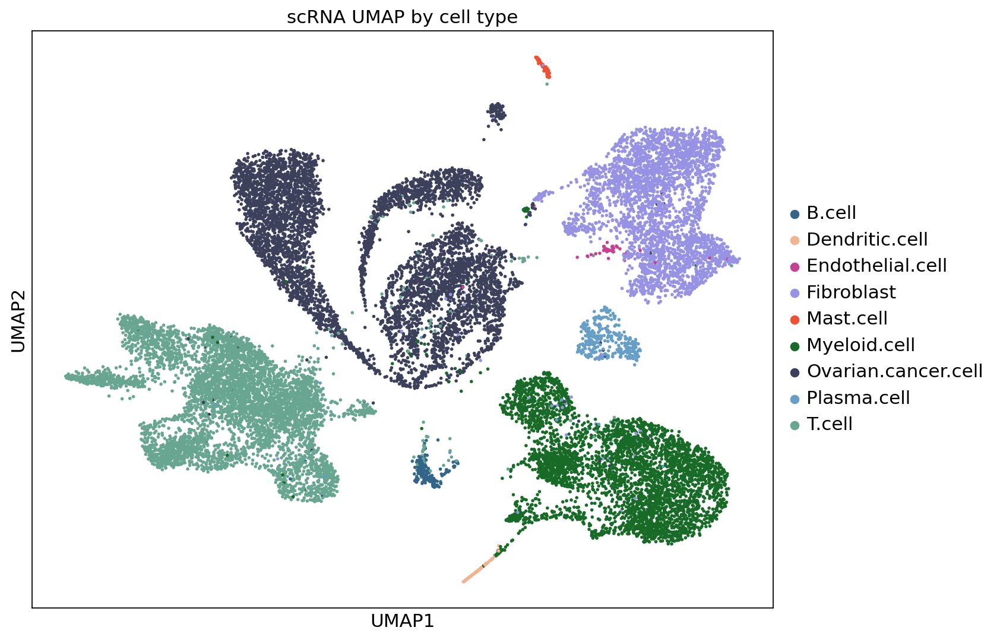

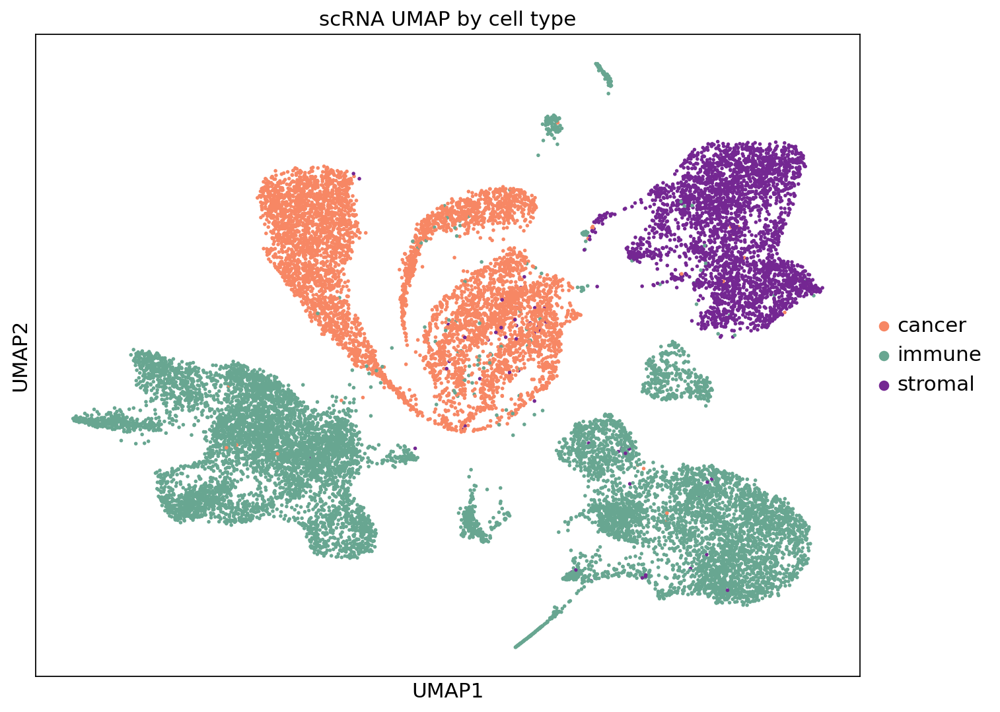

In [64]:
f1 = sc.pl.umap(adata,
                color='patient_id',
                title='scRNA UMAP by patient',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=25,
                palette=patients_colors_EOC,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_by_patient_allcells.pdf",
#                                  dpi=600, bbox_inches='tight')

f2 = sc.pl.umap(adata,
                color='cell_type_updated',
                title='scRNA UMAP by cell type',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=25,
                palette=color_mapping_long,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_by_celltype_allcells.pdf",
#                                  dpi=600, bbox_inches='tight')

f3 = sc.pl.umap(adata,
                color='cell_type',
                title='scRNA UMAP by cell type',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=25,
                palette=color_mapping_short,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_by_3celltype_allcells.pdf",
#                                  dpi=600, bbox_inches='tight')

# Boxplot with TME

In [65]:
meta = adata.obs.copy()

In [66]:
meta.columns

Index(['sample', 'patient_id', 'anatomical_location', 'cell_type',
       'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads',
       'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT',
       'status', 'SBS3', 'cell_id'],
      dtype='object')

In [67]:
meta.cell_type.value_counts()

immune     10475
cancer      5449
stromal     3232
Name: cell_type, dtype: int64

In [73]:
meta_copy = meta.copy()
cell_counts = meta.groupby(['patient_id', 'cell_type']).size().reset_index(name='count')

total_counts = meta_copy.groupby(['patient_id']).size().reset_index(name='total_count')
proportions = pd.merge(cell_counts, total_counts, on=['patient_id'])
proportions['proportion'] = proportions['count'] / proportions['total_count']

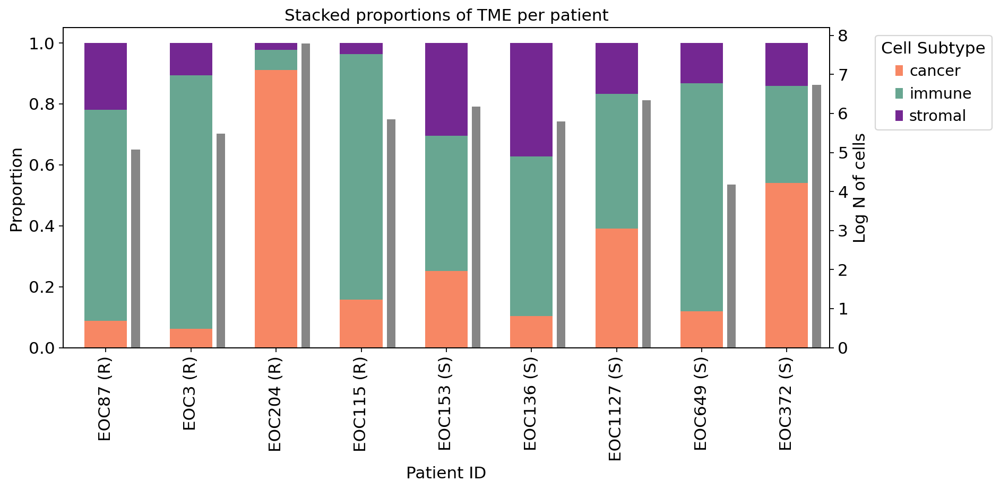

In [74]:
pivot_df = proportions.pivot(index='patient_id',
                             columns='cell_type',
                             values='proportion').fillna(0)

pat_order = patients_ordered
pivot_df = pivot_df.loc[pat_order]

fig, ax = plt.subplots(figsize=(12, 6))
pivot_df.plot(kind='bar',
              stacked=True,
              color=[color_mapping_short[sub] for sub in pivot_df.columns],
              ax=ax)

ax.set_title(f'Stacked proportions of TME per patient')
ax.set_ylabel('Proportion')
ax.set_xlabel('Patient ID')
ax.legend(title='Cell Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xticklabels(
    [x + f" ({mymeta.loc[x, 'Definition']})" for x in patients_ordered],
    rotation=90, fontsize=14
)
plt.tight_layout()
plt.grid(False)

ax2 = ax.twinx()
counts = [
    np.log1p(x) for x in list(meta_copy[meta_copy.cell_type == 'cancer']
    .groupby('patient_id')['cell_type']
    .count().loc[patients_ordered].values)
]
ax2.bar(
    [x + 0.35 for x in range(len(patients_ordered))],
    counts, width=0.1, color='grey', alpha=0.95
)
ax2.set_ylabel('Log N of cells')
ax2.set_ylim(0, max(counts) + 0.4)

plt.tight_layout()
plt.grid(False)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Barplot_composition_3celltypes.pdf",
#                                  dpi=600, bbox_inches='tight')

In [75]:
meta_copy = meta.copy()
cell_counts = meta.groupby(['patient_id', 'cell_type_updated']).size().reset_index(name='count')

total_counts = meta_copy.groupby(['patient_id']).size().reset_index(name='total_count')
proportions = pd.merge(cell_counts, total_counts, on=['patient_id'])
proportions['proportion'] = proportions['count'] / proportions['total_count']

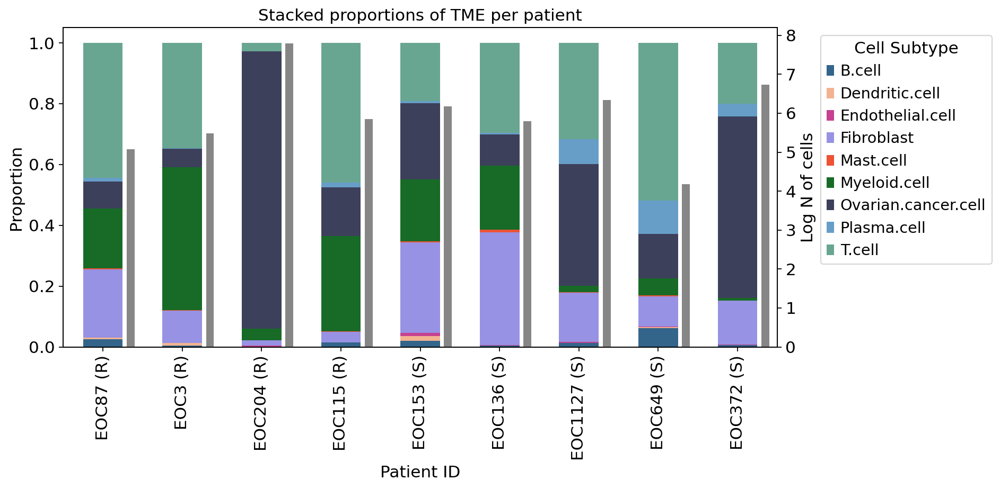

In [76]:
pivot_df = proportions.pivot(index='patient_id',
                             columns='cell_type_updated',
                             values='proportion').fillna(0)

pat_order = patients_ordered
pivot_df = pivot_df.loc[pat_order]

fig, ax = plt.subplots(figsize=(12, 6))
pivot_df.plot(kind='bar',
              stacked=True,
              color=[color_mapping_long[sub] for sub in pivot_df.columns],
              ax=ax)

ax.set_title(f'Stacked proportions of TME per patient')
ax.set_ylabel('Proportion')
ax.set_xlabel('Patient ID')
ax.legend(title='Cell Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xticklabels(
    [x + f" ({mymeta.loc[x, 'Definition']})" for x in patients_ordered],
    rotation=90, fontsize=14
)
plt.tight_layout()
plt.grid(False)

ax2 = ax.twinx()
counts = [
    np.log1p(x) for x in list(meta_copy[meta_copy.cell_type == 'cancer']
    .groupby('patient_id')['cell_type']
    .count().loc[patients_ordered].values)
]
ax2.bar(
    [x + 0.35 for x in range(len(patients_ordered))],
    counts, width=0.1, color='grey', alpha=0.95
)
ax2.set_ylabel('Log N of cells')
ax2.set_ylim(0, max(counts) + 0.4)

plt.tight_layout()
plt.grid(False)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Barplot_composition_allcelltypes.pdf",
#                                  dpi=600, bbox_inches='tight')

# EOC analysis

In [77]:
meta.head(3)

,sample,patient_id,anatomical_location,cell_type,cell_type_updated,nCount_RNA,nFeature_RNA,nReads,log2nCount,log2nFeature,log2nReads,percent.mt,NACT,status,SBS3,cell_id
AAAGATGCAGACGTAG-8,EOC649_pOme,EOC649,Omentum,immune,T.cell,3613,973,55379,11.818982,9.926296,15.757051,2.158871,primary,Sensitive,HRP,AAAGATGCAGACGTAG-8
AAAGATGTCAGGATCT-8,EOC649_pOme,EOC649,Omentum,immune,T.cell,4037,1621,53560,11.979068,10.662668,15.708868,3.195442,primary,Sensitive,HRP,AAAGATGTCAGGATCT-8
AAAGCAACACGGTTTA-8,EOC649_pOme,EOC649,Omentum,immune,Plasma.cell,1714,515,23059,10.743151,9.008429,14.493042,2.975496,primary,Sensitive,HRP,AAAGCAACACGGTTTA-8


In [80]:
meta_EOC = meta[meta['cell_type'] == 'cancer']
adata_EOC = adata_copy[adata_copy.obs.cell_type == 'cancer']

In [81]:
adata_EOC

View of AnnData object with n_obs × n_vars = 5449 × 58037
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    layers: 'counts'

## Normalizing the data

In [82]:
# Normalizing total counts per cell
print('normalize_total')
sc.pp.normalize_total(
    adata_EOC, 
    target_sum=1e4, 
    exclude_highly_expressed=True
)

# Logarithmic transformation
print('log1p')
sc.pp.log1p(adata_EOC)

# Identifying highly variable genes
print('highly_variable_genes')
sc.pp.highly_variable_genes(
    adata_EOC, 
    flavor='seurat_v3', 
    n_top_genes=2000, 
    subset=False
)

# Save raw data
print('raw')
adata_EOC.raw = adata_EOC

# Regress out technical effects
print('regress_out')
sc.pp.regress_out(
    adata_EOC, 
    ['nCount_RNA', 'percent.mt'], 
    n_jobs=50
)

# Scaling the data
print('scale')
sc.pp.scale(adata_EOC, max_value=10)

# Storing normalized data in a layer
adata_EOC.layers['normalized'] = adata_EOC.X

normalize_total


/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


log1p
highly_variable_genes


/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


raw
regress_out
scale


In [83]:
# Principal Component Analysis (PCA)
print('pca')
sc.tl.pca(
    adata_EOC, 
    svd_solver='arpack', 
    use_highly_variable=True, 
    random_state=41
)

# Constructing a neighborhood graph
print('neighbors')
sc.pp.neighbors(
    adata_EOC, 
    n_neighbors=15, 
    n_pcs=30, 
    random_state=41
)

# UMAP embedding
print('umap')
sc.tl.umap(
    adata_EOC, 
    random_state=41, 
    spread=.5, 
    min_dist=0.8
)

pca
neighbors
umap


In [89]:
adata_EOC

AnnData object with n_obs × n_vars = 5449 × 58037
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

In [177]:
sc.set_figure_params(figsize=(10, 8), frameon=False,
                     dpi_save=600, vector_friendly=True)
sc.settings.n_jobs=2

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


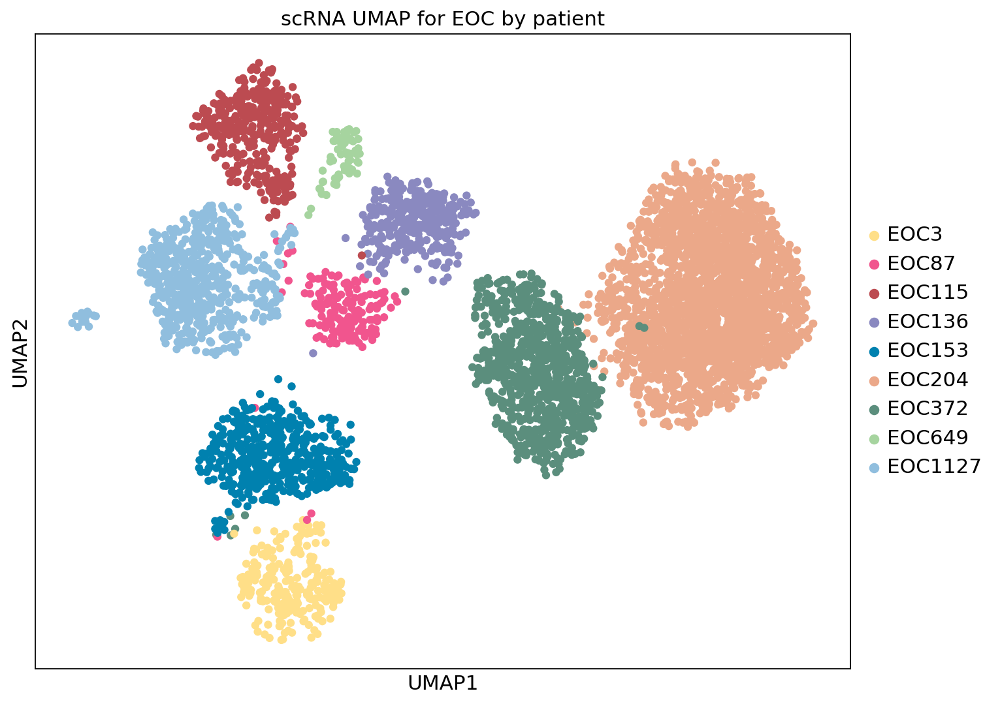

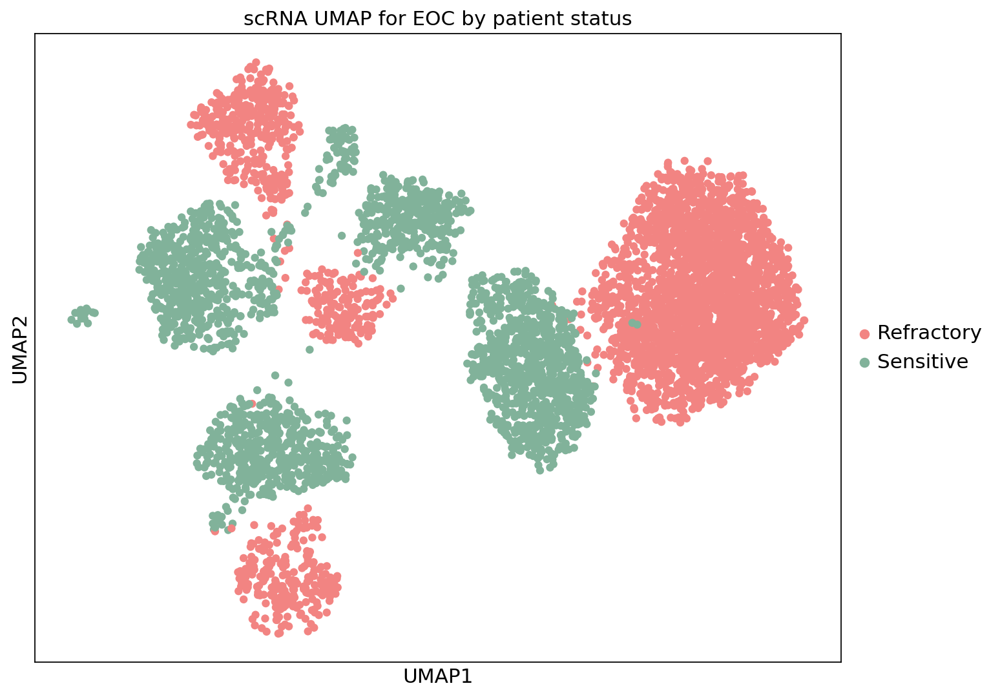

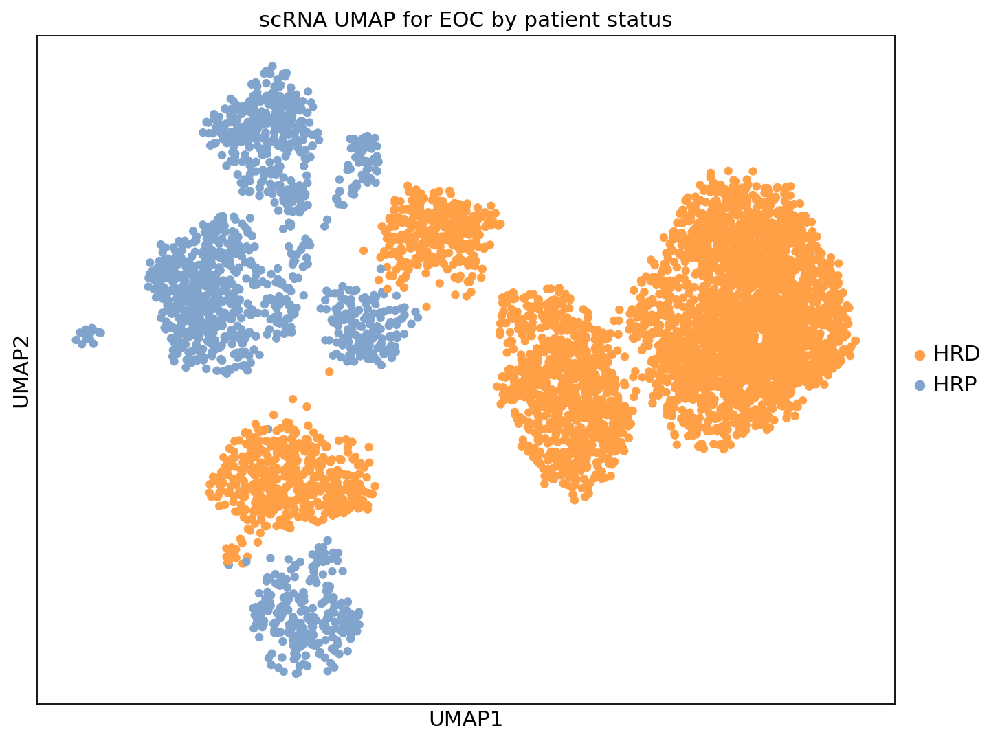

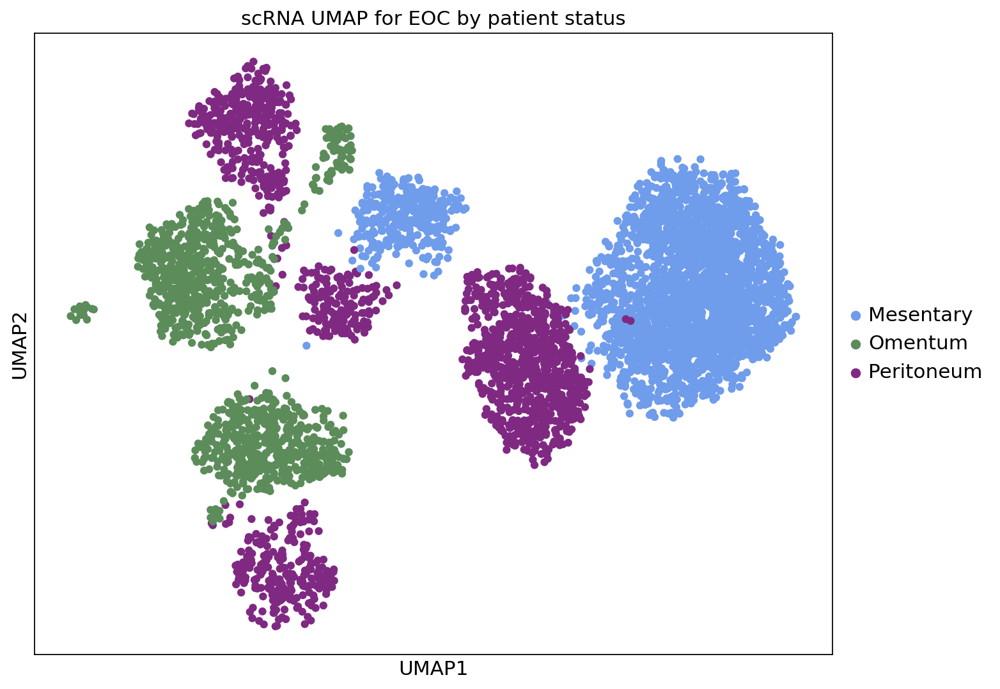

In [92]:
f1 = sc.pl.umap(adata_EOC,
                color='patient_id',
                title='scRNA UMAP for EOC by patient',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=125,
                palette=patients_colors_EOC,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_EOC_bypatient.pdf",
#                                  dpi=600, bbox_inches='tight')

f2 = sc.pl.umap(adata_EOC,
                color='status',
                title='scRNA UMAP for EOC by patient status',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=125,
                palette=status_palette,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_EOC_bystatus.pdf",
#                                  dpi=600, bbox_inches='tight')

f3 = sc.pl.umap(adata_EOC,
                color='SBS3',
                title='scRNA UMAP for EOC by patient status',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=125,
                palette=HRD_palette,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_EOC_bySBS3.pdf",
#                                  dpi=600, bbox_inches='tight')

f4 = sc.pl.umap(adata_EOC,
                color='anatomical_location',
                title='scRNA UMAP for EOC by patient status',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=125,
                palette=tissue_palette,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_EOC_bytissue.pdf",
#                                  dpi=600, bbox_inches='tight')

## DecoupleR

### Progeny

In [93]:
progeny = dc.get_progeny(organism='human', top=500)
progeny.head(3)

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44


In [94]:
dc.run_mlm(
    mat=adata_EOC,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

18899 features of mat are empty, they will be removed.
Running mlm on mat with 5449 samples and 39138 targets for 14 sources.


In [95]:
adata_EOC.obsm['progeny_mlm_estimate'] = adata_EOC.obsm['mlm_estimate'].copy()
adata_EOC.obsm['progeny_mlm_pvals'] = adata_EOC.obsm['mlm_pvals'].copy()
adata_EOC

AnnData object with n_obs × n_vars = 5449 × 58037
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

In [96]:
acts_EOC = dc.get_acts(adata_EOC, obsm_key='mlm_estimate')
acts_EOC

AnnData object with n_obs × n_vars = 5449 × 14
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

In [97]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=200,
    facecolor="white",
    frameon=False,
)

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


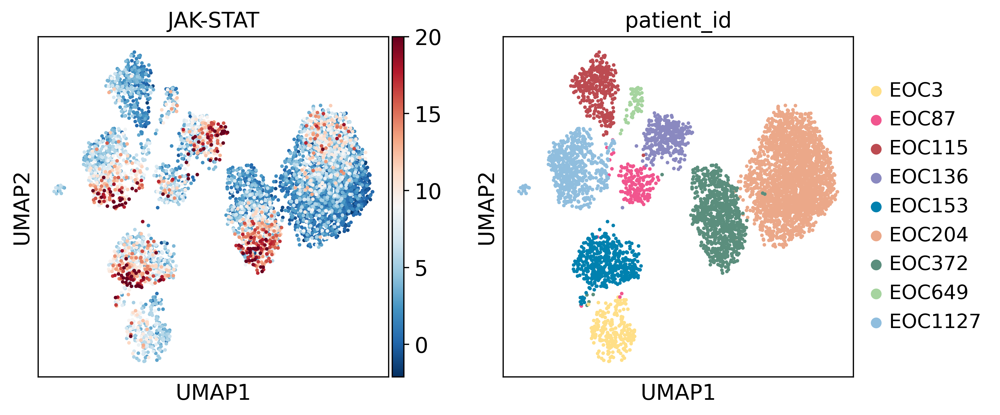

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 800x800 with 0 Axes>

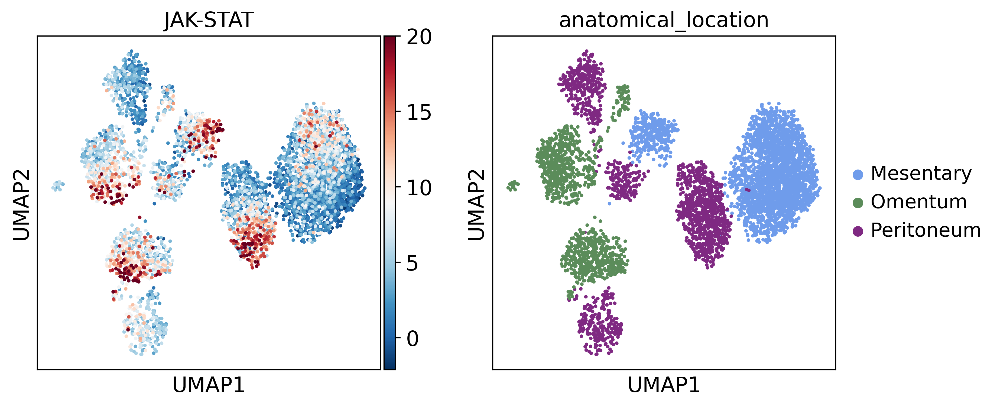

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Figure size 800x800 with 0 Axes>

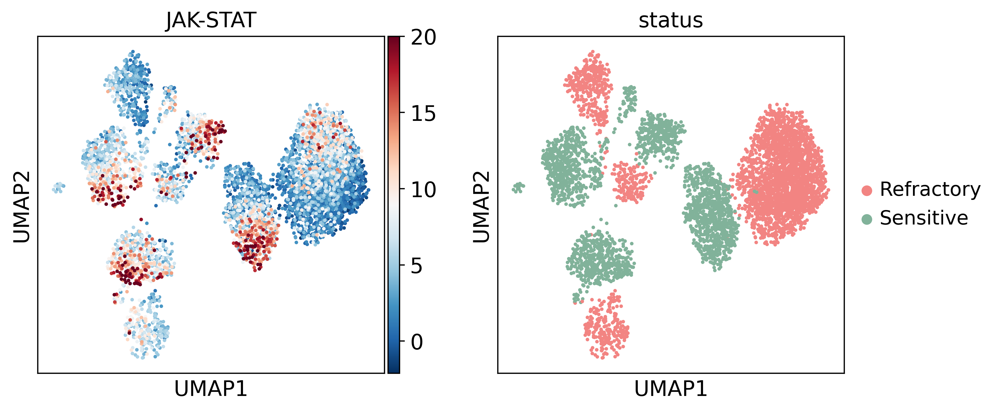

<Figure size 800x800 with 0 Axes>

In [100]:
sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'patient_id'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=patients_colors_EOC)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_JAKSTAT_EOC_bypatient.pdf",
#                                  dpi=600, bbox_inches='tight')

sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'anatomical_location'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=tissue_palette)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_JAKSTAT_EOC_bytissue.pdf",
#                                  dpi=600, bbox_inches='tight')

sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'status'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=status_palette)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_JAKSTAT_EOC_bystatus.pdf",
#                                  dpi=600, bbox_inches='tight')

In [101]:
acts_EOC.obs['JAK-STAT-activity'] = acts_EOC.obsm['mlm_estimate']['JAK-STAT']

In [102]:
mymeta = mymeta.merge(acts_EOC.obs.groupby('patient_id')['JAK-STAT-activity'].median(),
             left_on='publication_code', right_on='patient_id')
mymeta

,scRNA_sample,publication_code,Status,SBS3,tissue,Definition,JAK-STAT-activity
0,EOC3_pPer,EOC3,Refractory,HRP,Peritoneum,R,5.665198
1,EOC87_pPer,EOC87,Refractory,HRP,Peritoneum,R,5.443935
2,EOC204_pMes,EOC204,Refractory,HRD,Mesentary,R,2.056817
3,EOC115_pPer,EOC115,Refractory,HRP,Peritoneum,R,2.541669
4,EOC372_pPer,EOC372,Sensitive,HRD,Peritoneum,S,4.987462
5,EOC136_pMes,EOC136,Sensitive,HRD,Mesentary,S,7.921985
6,EOC153_pOme,EOC153,Sensitive,HRD,Omentum,S,8.066693
7,EOC649_pOme,EOC649,Sensitive,HRP,Omentum,S,4.471282
8,EOC1127_pOme,EOC1127,Sensitive,HRP,Omentum,S,6.740178


/tmp/ipykernel_164345/728529151.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_164345/728529151.py:12: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_164345/728529151.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_164345/728529151.py:35: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x='SBS3', y='JAK-STAT

Text(0, 0.5, 'median JAK-STAT-activity')

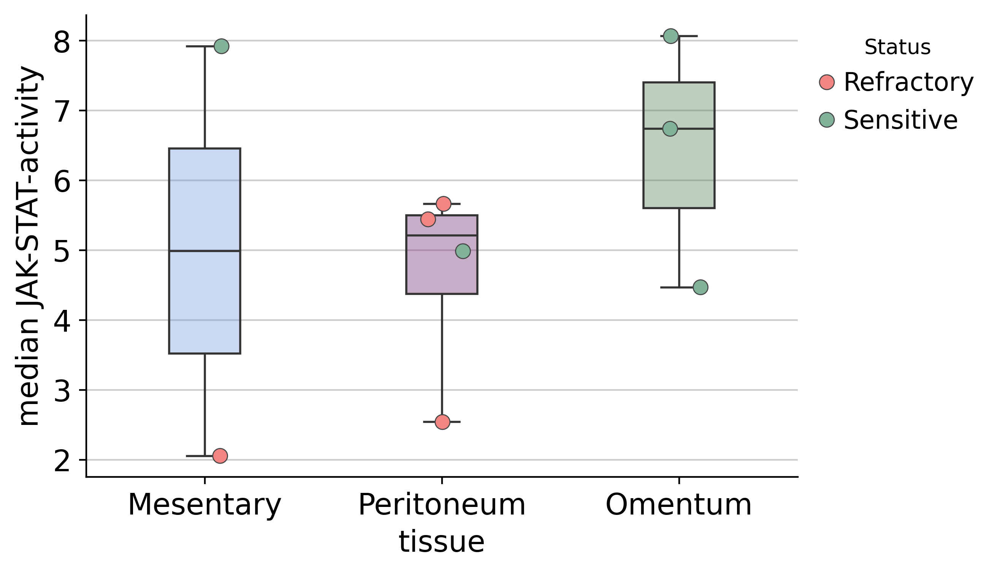

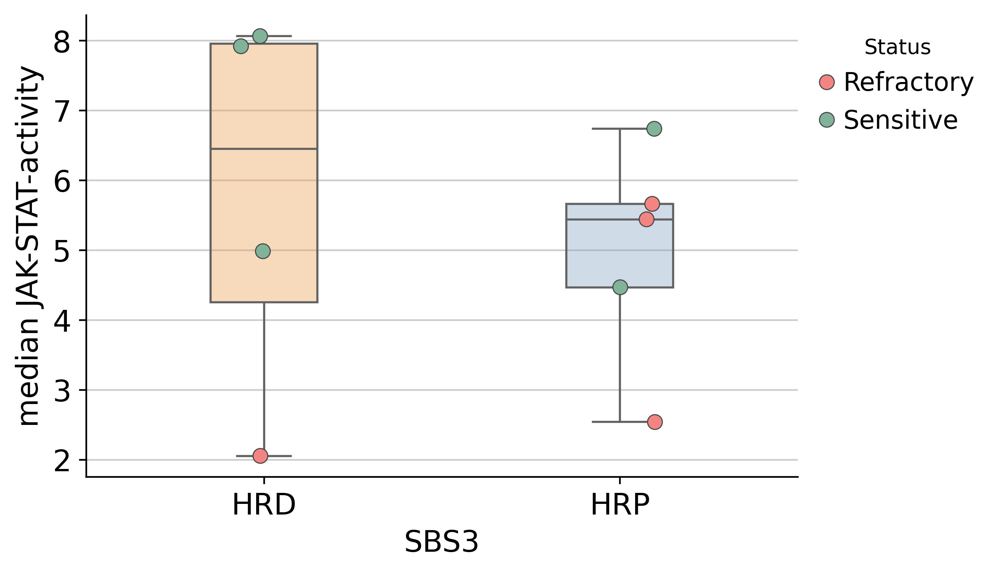

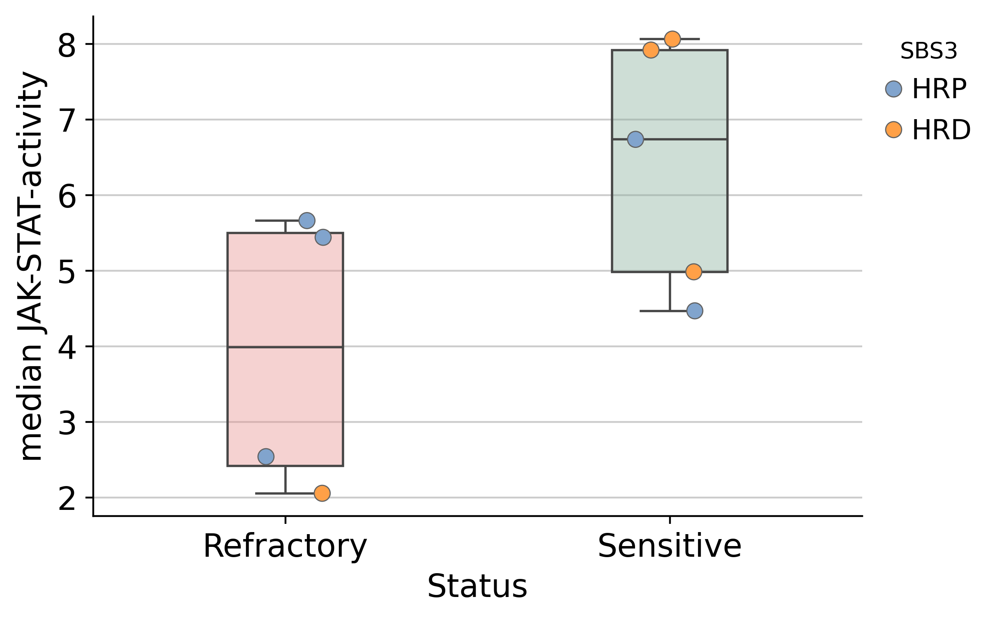

In [103]:
# sns.set_style("white")
f, ax = plt.subplots(figsize=(6, 4))

ax = sns.boxplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['Mesentary', 'Peritoneum', 'Omentum'],
               width=0.3, palette=tissue_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
              order=['Mesentary', 'Peritoneum', 'Omentum'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=status_palette,
              jitter=True, hue='Status')
sns.despine(top=True, right=True)
ax.legend(title='Status', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')



f, ax = plt.subplots(figsize=(6, 4)) 

ax = sns.boxplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['HRD', 'HRP'],
               width=0.3, palette=HRD_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
              order=['HRD', 'HRP'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=status_palette,
              jitter=True, hue='Status')
sns.despine(top=True, right=True)
ax.legend(title='Status', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')



f, ax = plt.subplots(figsize=(6, 4))

ax = sns.boxplot(x='Status', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['Refractory', 'Sensitive'],
               width=0.3, palette=status_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='Status', y='JAK-STAT-activity', data=mymeta,
              order=['Refractory', 'Sensitive'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=HRD_palette,
              jitter=True, hue='SBS3')
sns.despine(top=True, right=True)
ax.legend(title='SBS3', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')

### CollecTRI

In [104]:
net = dc.get_collectri(organism='human', split_complexes=False)
net.head(5)

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...


In [105]:
dc.run_ulm(
    mat=adata_EOC,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

18899 features of mat are empty, they will be removed.
Running ulm on mat with 5449 samples and 39138 targets for 762 sources.


In [106]:
adata_EOC.obsm['collectri_ulm_estimate'] = adata_EOC.obsm['ulm_estimate'].copy()
adata_EOC.obsm['collectri_ulm_pvals'] = adata_EOC.obsm['ulm_pvals'].copy()
acts_EOC = dc.get_acts(adata_EOC, obsm_key='ulm_estimate')

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


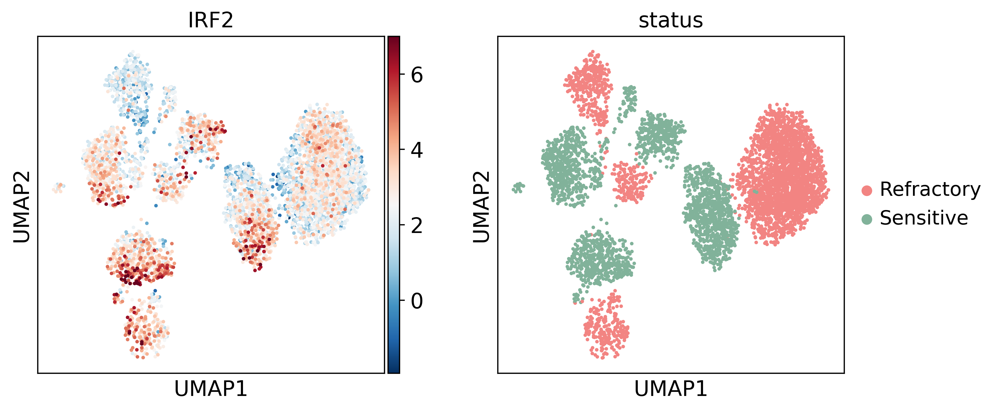

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


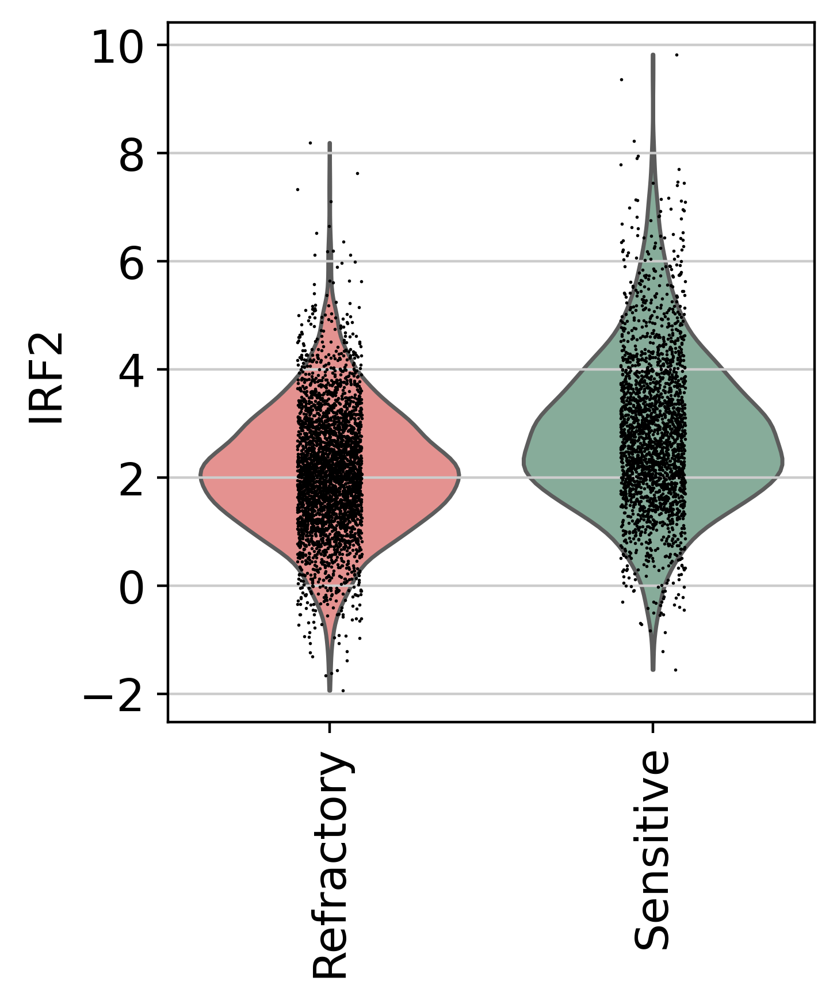

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


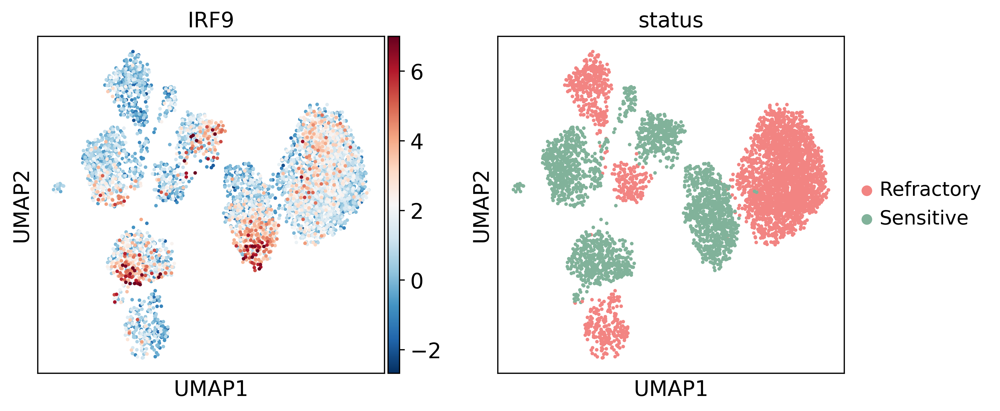

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:843: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


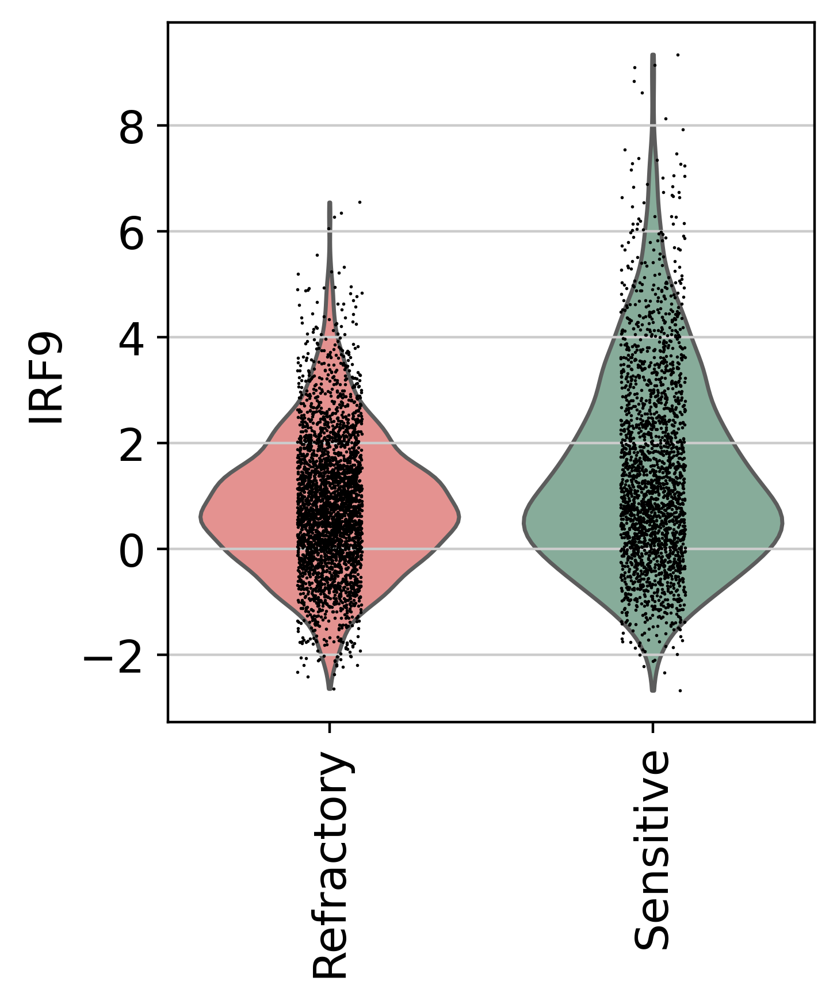

In [107]:
sc.pl.umap(acts_EOC, color=['IRF2', 'status'], cmap='RdBu_r', vmax=7, frameon=True)
sc.pl.violin(acts_EOC, keys=['IRF2'], groupby='status', rotation=90, )

sc.pl.umap(acts_EOC, color=['IRF9', 'status'], cmap='RdBu_r', vmax=7, frameon=True)
sc.pl.violin(acts_EOC, keys=['IRF9'], groupby='status', rotation=90)

In [110]:
a = acts_EOC.obsm['collectri_ulm_estimate'].loc[acts_EOC[acts_EOC.obs['status'] == 'Sensitive'].obs.index]
b = acts_EOC.obsm['collectri_ulm_estimate'].loc[acts_EOC[acts_EOC.obs['status'] == 'Refractory'].obs.index]

#### Plot for comparison

In [112]:
a['patient'] = [x.split('-')[1].split('_')[0] for x in a.index]
b['patient'] = [x.split('-')[1].split('_')[0] for x in b.index]

a['status'] = 'Sensitive'
b['status'] = 'Refractory'

combined_df = pd.concat([a[['IRF2', 'IRF9', 'status', 'patient']],
                         b[['IRF2', 'IRF9', 'status', 'patient']]])

In [113]:
import statsmodels.api as sm

In [114]:
model_gee_tumor = sm.GEE.from_formula("IRF2 ~ status", groups="patient", data=combined_df)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                               GEE Regression Results                              
Dep. Variable:                        IRF2   No. Observations:                 5449
Model:                                 GEE   No. clusters:                        9
Method:                        Generalized   Min. cluster size:                  64
                      Estimating Equations   Max. cluster size:                2429
Family:                           Gaussian   Mean cluster size:               605.4
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Tue, 21 Jan 2025   Scale:                           1.594
Covariance type:                    robust   Time:                         11:40:51
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               2.1033      0.141     14.913      0.000     

In [115]:
model_gee_tumor = sm.GEE.from_formula("IRF9 ~ status", groups="patient", data=combined_df)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                               GEE Regression Results                              
Dep. Variable:                        IRF9   No. Observations:                 5449
Model:                                 GEE   No. clusters:                        9
Method:                        Generalized   Min. cluster size:                  64
                      Estimating Equations   Max. cluster size:                2429
Family:                           Gaussian   Mean cluster size:               605.4
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Tue, 21 Jan 2025   Scale:                           2.317
Covariance type:                    robust   Time:                         11:40:53
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.8295      0.168      4.925      0.000     

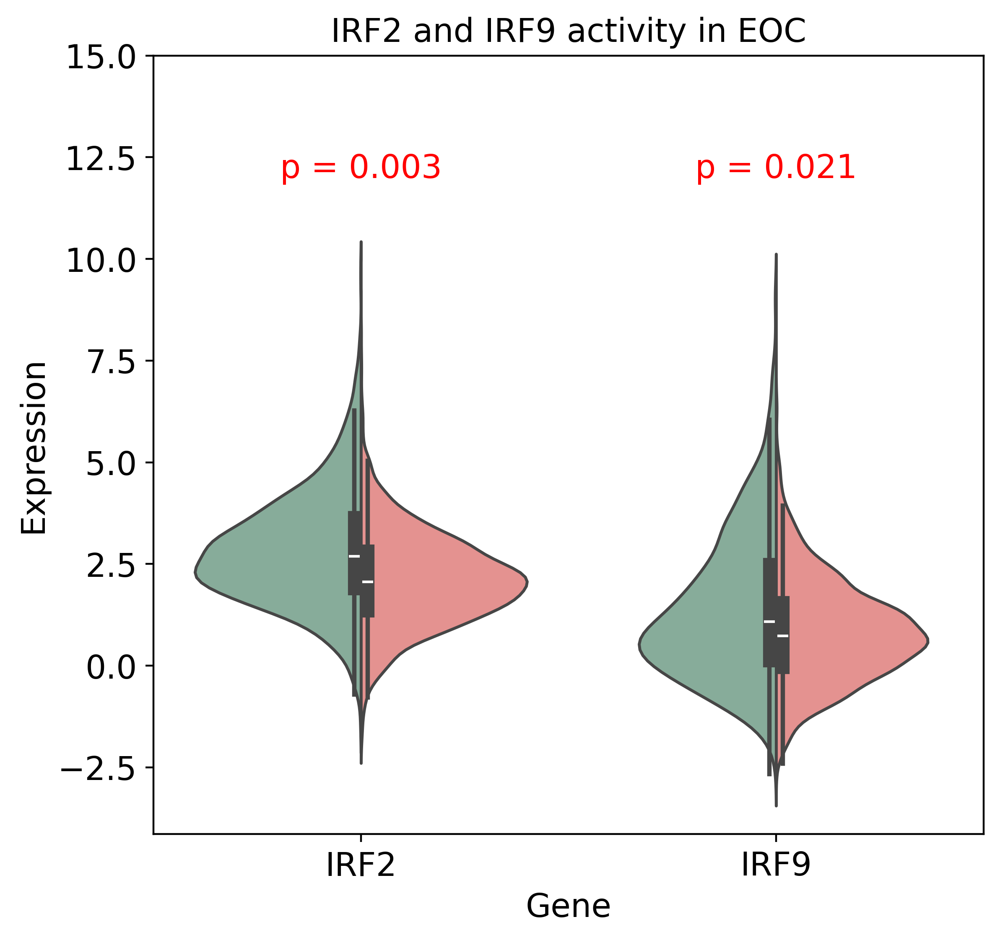

In [119]:
melted_df = combined_df.melt(id_vars='status', value_vars=['IRF2', 'IRF9'], 
                             var_name='Gene', value_name='Expression')

plt.figure(figsize=(6, 6))
sns.violinplot(x='Gene', y='Expression', hue='status', data=melted_df, 
               split=True, palette=status_palette, legend=False)

genes = ['IRF2', 'IRF9']
p_values = {'IRF2': 0.003, 'IRF9': 0.021}

for i, gene in enumerate(genes):
    p_val = p_values[gene]
    plt.text(i, max(melted_df['Expression']) + 2, f'p = {p_val:.3f}', 
             ha='center', va='bottom', color='red')

plt.title('IRF2 and IRF9 activity in EOC')
plt.xlabel('Gene')
plt.ylabel('Expression')
plt.tight_layout()
plt.grid(False)
plt.ylim(top=15)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Violin_plots_IRF2_IRF9.pdf",
#                                  dpi=600, bbox_inches='tight')

plt.show()

## ORA

In [120]:
# Filter by hallmark
msigdb = dc.get_resource('MSigDB')
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]
msigdb.head(3)

,genesymbol,collection,geneset
11,MSC,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
149,ICOSLG,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
223,ICOSLG,hallmark,HALLMARK_INFLAMMATORY_RESPONSE


In [121]:
dc.run_ora(
    mat=adata_EOC,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

18899 features of mat are empty, they will be removed.
Running ora on mat with 5449 samples and 39138 targets for 50 sources.


100%|███████████████████████████████████████████████████████████████████████████████████████████| 5449/5449 [00:11<00:00, 459.33it/s]


In [122]:
acts_EOC_msigdb = dc.get_acts(adata_EOC, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_EOC_msigdb_v = acts_EOC_msigdb.X.ravel()
max_e = np.nanmax(acts_EOC_msigdb_v[np.isfinite(acts_EOC_msigdb_v)])
acts_EOC_msigdb.X[~np.isfinite(acts_EOC_msigdb.X)] = max_e

acts_EOC_msigdb

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 5449 × 50
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [123]:
acts_EOC_msigdb.obs['HALLMARK_INTERFERON_ALPHA_RESPONSE'] =\
acts_EOC_msigdb.obsm['ora_estimate']['HALLMARK_INTERFERON_ALPHA_RESPONSE']

In [124]:
# df_copy = df.drop_duplicates(subset=['patient_id', 'HALLMARK_IFN_ALPHA_RESPONSE'], keep='first')

In [125]:
mymeta.index = mymeta.publication_code

/tmp/ipykernel_164345/3844362685.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='patient_id', y='HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled', data=df,
/tmp/ipykernel_164345/3844362685.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([x + ' ({status})'.format(status=mymeta.loc[x, 'Definition']) for x in patients_ordered],


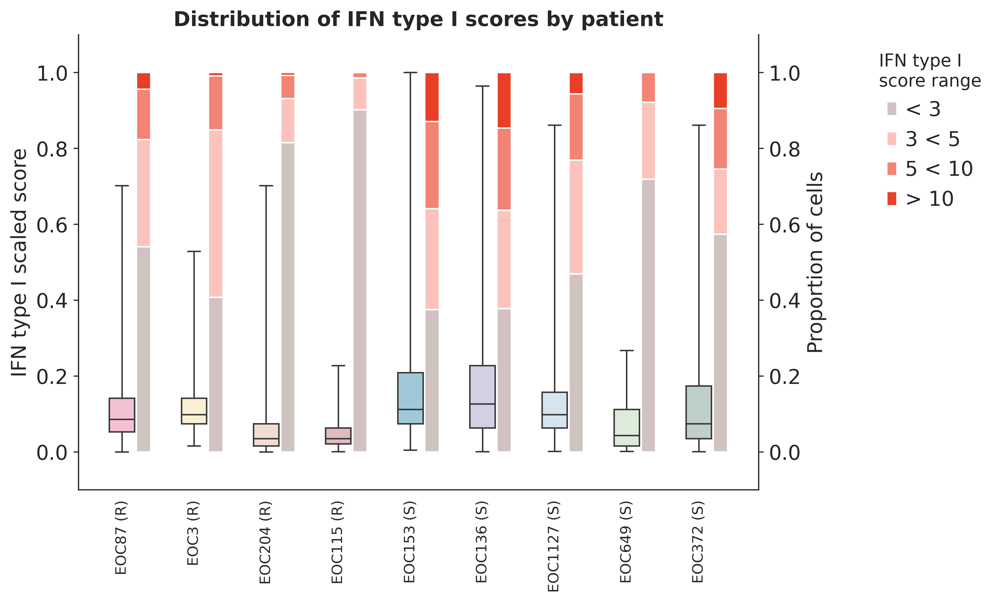

In [127]:
sns.set_style("white")

df = acts_EOC_msigdb.obs.copy()

df['sample'] = pd.Categorical(df['sample'],
                              categories=samples_ordered,
                              ordered=True)
df = df.sort_values(by='sample')

# Scale the JAK-STAT scores to be between 0 and 1
df['HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled'] = (df['HALLMARK_INTERFERON_ALPHA_RESPONSE'] -\
                                                   df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].min()) /\
(df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].max() - df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].min())

# Define JAK-STAT score ranges
df['HALLMARK_INTERFERON_ALPHA_RESPONSE_range'] = pd.cut(df['HALLMARK_INTERFERON_ALPHA_RESPONSE'],
                              bins=[-np.inf, 3, 5, 10, np.inf],
                              labels=['< 3', '3 < 5', '5 < 10', '> 10'])

bar_colors = {
    '< 3': '#D0C3C1',
    '3 < 5': '#FBC3BC',
    '5 < 10': '#F38375',
    '> 10': '#E93F29'
}

# Calculate proportions for the stacked bar plot
proportions = df.pivot_table(index='patient_id',
                             columns='HALLMARK_INTERFERON_ALPHA_RESPONSE_range',
                             aggfunc='size',
                             fill_value=0,
                             sort=False)
proportions = proportions.div(proportions.sum(axis=1), axis=0)

f, ax = plt.subplots(figsize=(10, 6))

ax = sns.boxplot(x='patient_id', y='HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled', data=df,
               ax=ax, order=patients_ordered,
               width=0.35, palette=patients_colors_EOC,
            saturation=0.8, fliersize=1, linewidth=1, whis=15)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

bottom = np.zeros(len(proportions))
bar_positions = np.arange(len(proportions)) + .3 
bar_width = 0.2  

for category in proportions.columns:
    ax.bar(bar_positions, proportions[category],
           bottom=bottom, label=category, width=bar_width,
           color=bar_colors[category])
    bottom += proportions[category].values

ax.set_xlabel('')
ax.set_ylabel('IFN type I scaled score', fontsize=14)
ax.legend(title='IFN type I\nscore range', fontsize=14, title_fontsize=12,
          frameon=False, loc='upper left', alignment='center', bbox_to_anchor=(1.15, 0.5, 0.5, 0.5))
ax.set_xticklabels([x + ' ({status})'.format(status=mymeta.loc[x, 'Definition']) for x in patients_ordered],
                   rotation=90, fontsize=10)
ax.set_title('Distribution of IFN type I scores by patient', fontsize=14, weight='bold')
ax.set_ylim(bottom=-0.1,top=1.1)

ax2 = ax.twinx()
ax2.set_ylim(-0.1, 1.1)
ax2.set_ylabel('Proportion of cells', fontsize=14)
sns.despine(f, ax, top=True, right=False)

plt.tight_layout()

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Boxplots_IFNactivity_EOC.pdf",
#                                  dpi=600, bbox_inches='tight')

plt.show()

In [128]:
acts_EOC_msigdb.obs = acts_EOC_msigdb.obs.rename(columns={'HALLMARK_INTERFERON_ALPHA_RESPONSE':
                                    'HALLMARK_IFN_ALPHA_RESPONSE'})

In [129]:
sns.set_style("white")

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


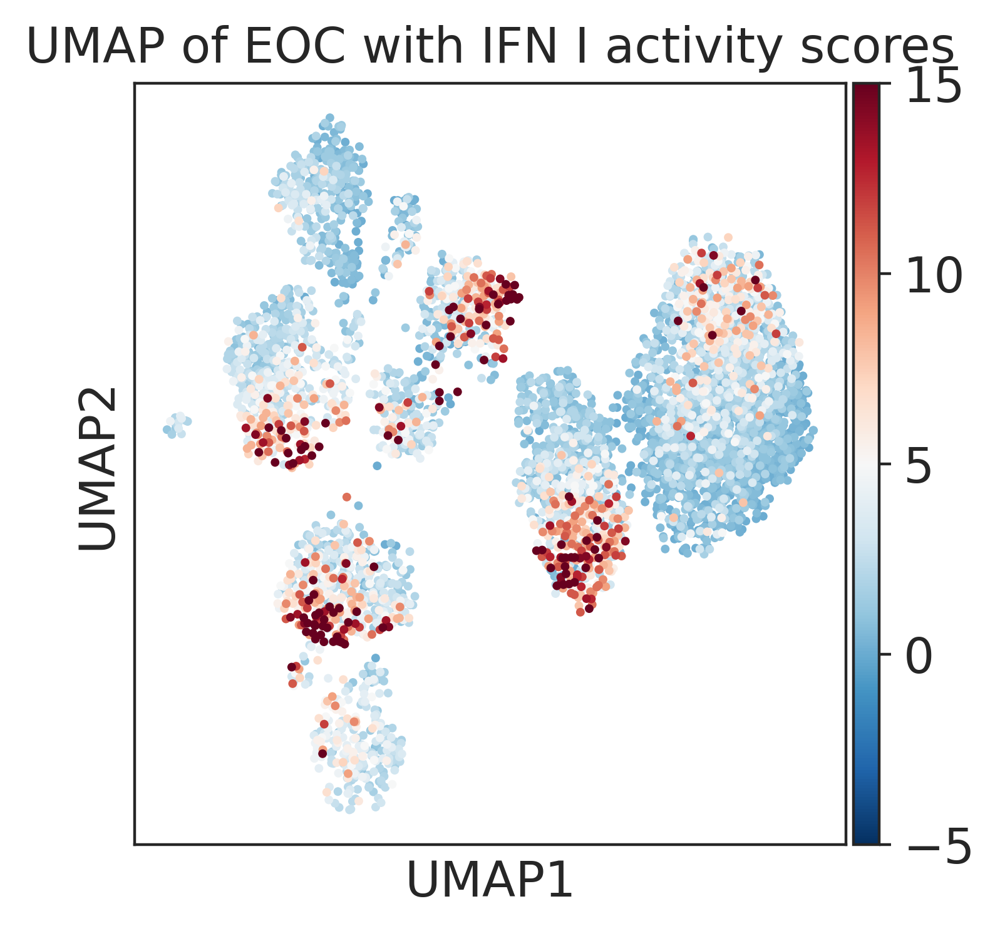

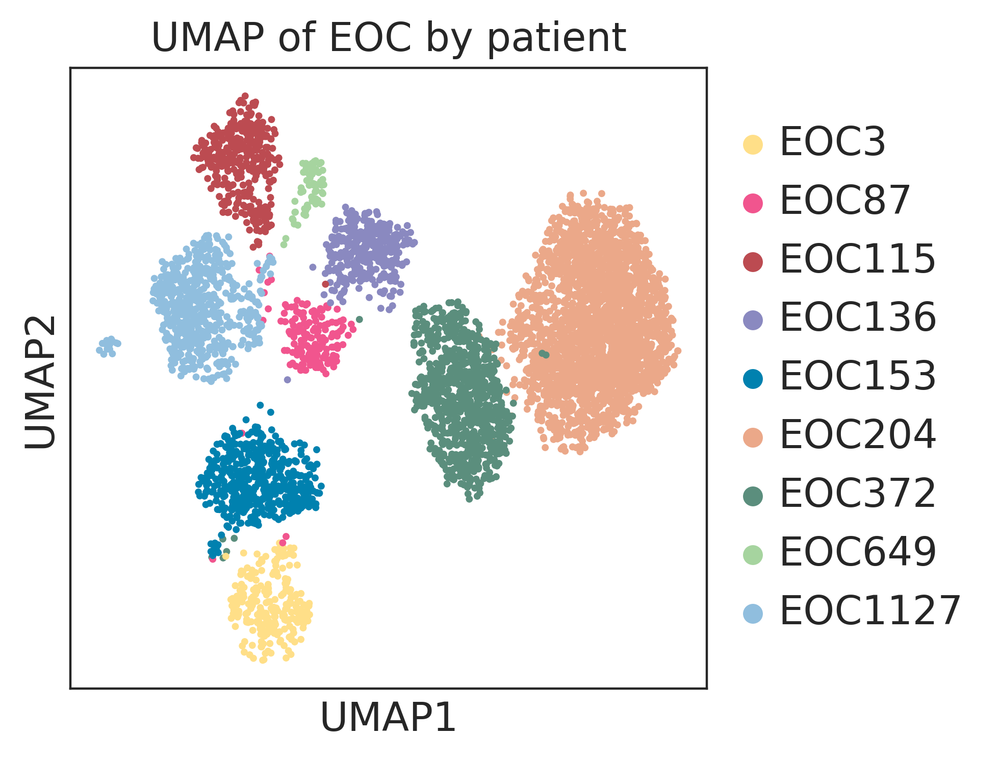

In [133]:
f1 = sc.pl.umap(acts_EOC_msigdb,
                color='HALLMARK_INTERFERON_ALPHA_RESPONSE',
                title='UMAP of EOC with IFN I activity scores',
                frameon=True,
                legend_fontweight='normal',
                cmap='RdBu_r',
                vmax=15, vmin=-5,
                legend_fontsize=6,
                s=25,
                return_fig=True)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/UMAP_IFNact_EOC.pdf",
#                                  dpi=600, bbox_inches='tight')

f2 = sc.pl.umap(acts_EOC_msigdb,
                color='patient_id',
                title='UMAP of EOC by patient',
                frameon=True,
                legend_fontweight='normal',
                palette=patients_colors_EOC,
                legend_fontsize=14,
                s=25,
                return_fig=True)

## Statistical tests

In [134]:
model_gee_tumor = sm.GEE.from_formula("HALLMARK_IFN_ALPHA_RESPONSE ~ status",
                                      groups="patient_id", data=acts_EOC_msigdb.obs)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                                  GEE Regression Results                                  
Dep. Variable:        HALLMARK_IFN_ALPHA_RESPONSE   No. Observations:                 5449
Model:                                        GEE   No. clusters:                        9
Method:                               Generalized   Min. cluster size:                  64
                             Estimating Equations   Max. cluster size:                2429
Family:                                  Gaussian   Mean cluster size:               605.4
Dependence structure:                Independence   Num. iterations:                     2
Date:                            Tue, 21 Jan 2025   Scale:                          10.589
Covariance type:                           robust   Time:                         11:51:10
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Inter

In [135]:
result_gee_tumor.pvalues['status[T.Sensitive]']

9.64885757026341e-10

In [136]:
mean_per_patient = acts_EOC_msigdb.obs.groupby('patient_id')['HALLMARK_IFN_ALPHA_RESPONSE'].mean()
patient_status = acts_EOC_msigdb.obs.groupby('patient_id')['status'].first()
responsive_mean = mean_per_patient[patient_status == 'Sensitive']
refractory_mean = mean_per_patient[patient_status == 'Refractory']

In [137]:
def permutation_test(data1, data2, n_permutations=10000):
    observed_diff = np.mean(data1) - np.mean(data2)
    combined = np.concatenate([data1, data2])
    count = 0

    for _ in range(n_permutations):
        np.random.shuffle(combined)
        new_data1 = combined[:len(data1)]
        new_data2 = combined[len(data1):]
        perm_diff = np.mean(new_data1) - np.mean(new_data2)
        if perm_diff >= observed_diff:
            count += 1
    
    return count / n_permutations

p_value_perm = permutation_test(responsive_mean.values, refractory_mean.values)
print(f'Permutation test (patient-level) p-value: {p_value_perm}')

Permutation test (patient-level) p-value: 0.0384


In [138]:
import scipy.stats as stats

refractory_scores = acts_EOC_msigdb.obs.loc[acts_EOC_msigdb.obs['status'] == 'Refractory',
                                            'HALLMARK_IFN_ALPHA_RESPONSE']
responsive_scores = acts_EOC_msigdb.obs.loc[acts_EOC_msigdb.obs['status'] == 'Sensitive',
                                            'HALLMARK_IFN_ALPHA_RESPONSE']

levene_stat, p_value_levene = stats.levene(responsive_scores, refractory_scores)

print(f"Levene’s test p-value: {p_value_levene}")

Levene’s test p-value: 2.6062085788362477e-85


## Cellular states (PRIMUS)

In [139]:
# EMT-associated gene signature
C3 = ['DST', 'EGFR', 'EPHB2', 'ITGA6', 'PIK3CD', 'PLEC', 'SFN', 'SMAD3', 'CLTC', 'EIF2AK2',
 'ITGA2', 'KPNA1', 'STAT1', 'BCAR1', 'CCND1', 'COL1A2', 'ITCH', 'MMP1', 'MMP12', 'PML',
 'TNC', 'CDK6', 'FADD', 'FAS', 'MX1', 'E2F3', 'BIRC2', 'CAPN2', 'VASP', 'MMP9', 'DFFA',
 'KPNB1', 'ADAMTS5', 'MMP10', 'AP2B1', 'ASAP1', 'SDCBP', 'CYP1A1', 'CYP1B1', 'CYP3A5',
 'MAFG', 'SLC7A11', 'IGF2']

# Differentiated gene signature
C4 = ['B3GNT7', 'B3GNT8', 'GCNT3', 'MUC15', 'MUC4', 'MUC5B', 'ST3GAL4', 'LCN2', 'S100A8', 'S100A9',
 'ALOX5', 'AOC1', 'B2M', 'C3', 'CEACAM1', 'CEACAM6', 'MGST1', 'OSTF1', 'PPBP', 'S100P',
 'SLPI', 'TMEM173', 'DSC2', 'EVPL', 'IVL', 'KRT13', 'KRT4', 'KRT6A', 'KRT6C', 'HRASLS2',
 'LPCAT4', 'PLBD1', 'RARRES3', 'CDKN2B', 'STEAP4', 'TGFB1', 'CFB', 'CCL28', 'CX3CL1', 'CXCL10']

# Proliferative DNA repair gene signature
C5 = ['AURKA', 'AURKB', 'BIRC5', 'BUB1', 'BUB1B', 'CCNA2', 'CCNB1', 'CCNB2', 'CDC20', 'CDC25C',
 'CDC45', 'CDC6', 'CDCA8', 'CDK1', 'CDT1', 'CENPA', 'CENPE', 'CENPF', 'CENPH', 'CENPK',
 'CENPM', 'CENPN', 'CENPU', 'CKAP5', 'DHFR', 'E2F1', 'H2AFV', 'H2AFZ', 'HAUS1', 'HIST1H2BH',
 'HIST1H3G', 'HIST1H4C', 'HIST2H2AC', 'KIF18A', 'KIF20A', 'KIF23', 'KIF2C', 'LIG1', 'LMNB1',
 'MAD2L1', 'MCM10', 'MCM2', 'MCM3', 'MCM4', 'MCM5', 'MCM6', 'MCM7', 'MCM8', 'NDC80',
 'NEK2', 'NUF2', 'ORC6', 'PCNA', 'PLK1', 'PLK4', 'POLD1', 'POLD2', 'PRIM1', 'PTTG1',
 'RFC2', 'RFC3', 'RFC4', 'RRM2', 'SGO1', 'SGO2', 'SKA1', 'SKA2', 'SKP2', 'SPC24',
 'SPC25', 'TK1', 'TMPO', 'TPX2', 'UBE2C', 'VRK1', 'ZWILCH', 'ZWINT', 'BRCA1', 'CHEK1',
 'CLSPN', 'RHNO1', 'RMI2', 'FANCG', 'HMGB2', 'KIF4A', 'RRM1', 'TYMS', 'RACGAP1',
 'CBX5', 'BRCA2', 'FANCD2', 'RAD51', 'RAD51AP1', 'FANCB', 'FANCI', 'UBE2T', 'KIF11',
 'KIF15', 'KIF20B', 'KIF22', 'KIFC1', 'HIST1H1A', 'HIST1H1B', 'GGH', 'DTYMK', 'AKR1B1']

# Stress-associated gene signature
C7 = ['CEBPB', 'CEBPD', 'FOS', 'IL6', 'JUN', 'JUNB', 'MCL1', 'MYC', 'SOCS3', 'ATF3', 'DUSP1',
 'EGR1', 'FOSB', 'CEBPA', 'DDIT3', 'EGR2', 'CDKN1A', 'GADD45B', 'TNF', 'HES1',
 'HBEGF', 'BCL6', 'NR4A1', 'DUSP6', 'GADD45G', 'ID2', 'NFKBIA', 'PLK3', 'SNAI2',
 'CREB5', 'HLA-G', 'HIST1H2BC', 'HIST1H2BG', 'CALML3', 'SNAI1']

# Cytokine and apoptosis gene signature
C9 = ['CCL20', 'CXCL1', 'IL1R2', 'IL1RN', 'SEC11C', 'SPCS3', 'BIK', 'BIRC3', 'CDKN2A', 'DAB2', 'GJB2']

# Antigen presentation gene signature
C10 = ['CTSL', 'HLA-DMA', 'HLA-DMB', 'HLA-DOA', 'HLA-DPA1', 'HLA-DPB1', 'HLA-DQA1', 'HLA-DQA2', 'HLA-DRA',
 'HLA-DRB5', 'HSP90AB1', 'HSPA2', 'HSPA4', 'HSPA5', 'HSPA6', 'PDIA3', 'CPE', 'CTSF', 'C1R',
 'CXADR', 'SFTPD', 'TUBB2A', 'TUBB6', 'FOLR1', 'GAS6', 'NPC2', 'RUNX1', 'TGFBR2', 'GNAI1',
 'RBPJ', 'IL11RA', 'HIST1H2AE', 'DNAJC3', 'FBXO2', 'HERPUD1', 'HSP90B1', 'SKP1', 'UBE2D1',
 'UBQLN1', 'NECTIN2', 'SDC2', 'CCND3', 'DNAJB9', 'ERP27', 'SIAH1', 'PPP2CA', 'BAG3', 'HSPA12A',
 'BMP2', 'LATS2', 'PPP2R2B', 'PRKCI', 'WNT6', 'IFITM1', 'IFITM2', 'CRMP1', 'DPYSL3', 'PLXNA2',
 'MYL9', 'TNNC1', 'TNNI1', 'TNNT2', 'TLE1', 'TLE4', 'APP', 'PELI2', 'VAMP2', 'DNAJA4', 'PLAT',
 'ACADVL', 'TSPYL2', 'NR1D2', 'PURA', 'GATA6', 'TWIST1', 'RING1', 'BAMBI', 'ATG101', 'RAPGEF2',
 'NR4A3', 'SOX4', 'SLC22A18']

# Interferon signaling gene signature
C3_4 = ['GBP4', 'IFI27', 'IFI35', 'IFIT1', 'ISG15', 'OAS1', 'OAS2', 'STAT2', 'TRIM22', 'TAP1', 'ITGAV']

# RNA processing gene signature
C3_11 = ['BMS1', 'DCAF13', 'MPHOSPH10', 'PNO1', 'ACIN1', 'ROCK1', 'TJP1', 'ESCO1', 'WAPL', 'EIF1AX',
 'PNN', 'RNPS1', 'DYNC1LI1', 'BDP1', 'CRCP', 'PAFAH1B1', 'PRPF40A', 'SFSWAP', 'KMT2A', 'SETD2']

# Proteasomal degradation gene signature
C5_8 = ['AIMP1', 'EIF3I', 'MRPL13', 'MRPL15', 'MRPL16', 'MRPL2', 'MRPL28', 'MRPL3', 'MRPS7', 'RPN2',
 'SRP9', 'TSFM', 'PSMA4', 'PSMB5', 'PSMB6', 'PSMB7', 'PSMC5', 'PSMD8', 'ACTL6A', 'BANF1',
 'PPIA', 'XRCC6', 'VDAC3', 'FH', 'MDH2', 'SDHB', 'TPI1', 'ECHS1', 'HSD17B10', 'POLR2G',
 'NDUFB6', 'HNRNPA2B1', 'HNRNPA3', 'SNRPD3', 'PRDX3', 'PTMA', 'CCT7', 'VBP1', 'COPE']

# TCA cycle gene signature
C5_8_10 = ['GLO1', 'IDH3B', 'NDUFA10', 'NDUFB5', 'PDHA1', 'SUCLG1', 'TRAP1', 'UQCRC1', 'UQCRC2',
 'MDH1', 'ALDH7A1', 'DECR1', 'ECH1', 'ECI2', 'PCCB', 'SHMT1', 'HACD3', 'PTGR1',
 'MGST2', 'PRDX6']

In [140]:
states_markers_dict = {
    'C3': C3,
    'C4': C4,
    'C5': C5,
    'C7': C7,
    'C9': C9,
    'C10': C10,
    'C3_4': C3_4,
    'C3_11': C3_11,
    'C5_8': C5_8,
    'C5_8_10': C5_8_10
}

states_markers_list = []
for cellular_state, genes in states_markers_dict.items():
    for gene in genes:
        states_markers_list.append({'genesymbol': gene, 'cellular_state': cellular_state})

states_markers = pd.DataFrame(states_markers_list)

In [141]:
dc.run_ora(
    mat=adata_EOC,
    net=states_markers,
    source='cellular_state',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

18899 features of mat are empty, they will be removed.
Running ora on mat with 5449 samples and 39138 targets for 10 sources.


100%|███████████████████████████████████████████████████████████████████████████████████████████| 5449/5449 [00:25<00:00, 213.27it/s]


In [142]:
acts = dc.get_acts(adata_EOC, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 5449 × 10
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [143]:
acts

AnnData object with n_obs × n_vars = 5449 × 10
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'cell_type_updated', 'nCount_RNA', 'nFeature_RNA', 'nReads', 'log2nCount', 'log2nFeature', 'log2nReads', 'percent.mt', 'NACT', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [144]:
df = dc.rank_sources_groups(acts,
                            groupby='cell_id',
                            reference='rest',
                            method='wilcoxon')
df.head(2)

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,AAACCTGCACCAGGTC-57,rest,C7,1.655127,8.003995,0.097899,0.363117
1,AAACCTGCACCAGGTC-57,rest,C10,1.650041,5.485775,0.098934,0.363117


In [145]:
n_ctypes = 3
ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()

In [146]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


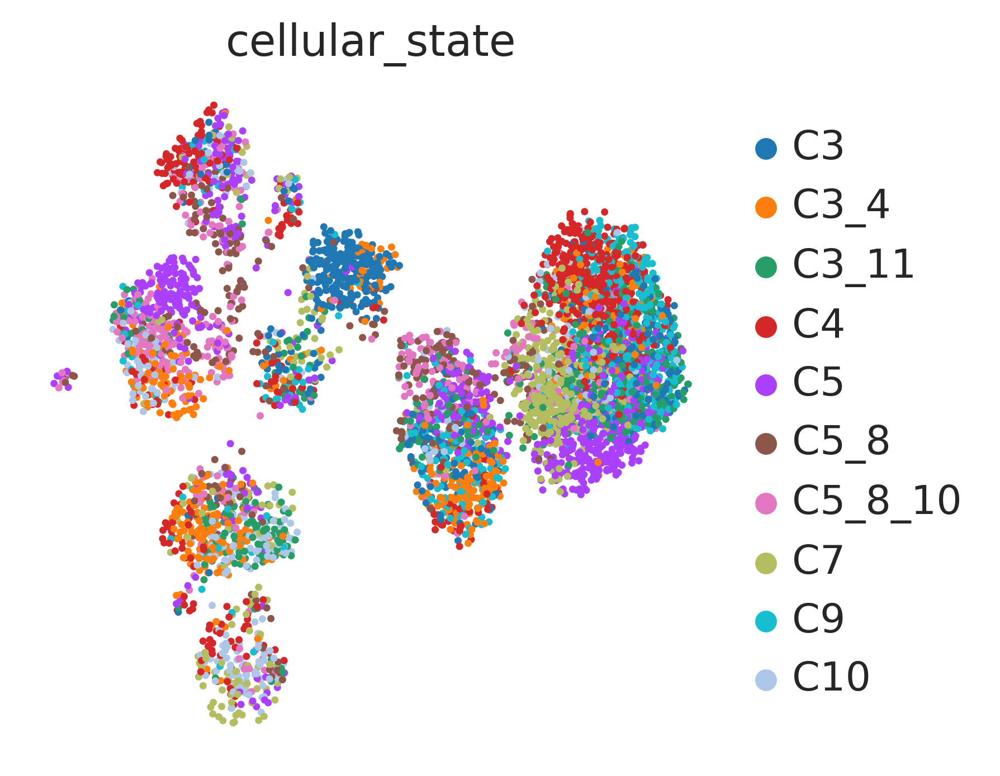

In [147]:
adata_EOC.obs['cellular_state'] = [annotation_dict[clust] for clust in adata_EOC.obs['cell_id']]
sc.pl.umap(adata_EOC, color='cellular_state')

In [148]:
adata_EOC.obs.groupby('patient_id')['cellular_state'].value_counts()

patient_id  cellular_state
EOC3        C10               73
            C7                64
            C4                46
            C5                14
            C5_8              12
                              ..
EOC1127     C4                24
            C3_11             22
            C9                16
            C3                 4
            C7                 4
Name: cellular_state, Length: 90, dtype: int64

In [149]:
adata_EOC.obs[['sample', 'patient_id', 'anatomical_location', 'status', 'SBS3', 'cellular_state']].head(3)

,sample,patient_id,anatomical_location,status,SBS3,cellular_state
AACACGTAGTTAAGTG-8,EOC649_pOme,EOC649,Omentum,Sensitive,HRP,C5
AACGTTGGTTTGTGTG-8,EOC649_pOme,EOC649,Omentum,Sensitive,HRP,C4
ACACCCTAGAAACCGC-8,EOC649_pOme,EOC649,Omentum,Sensitive,HRP,C4


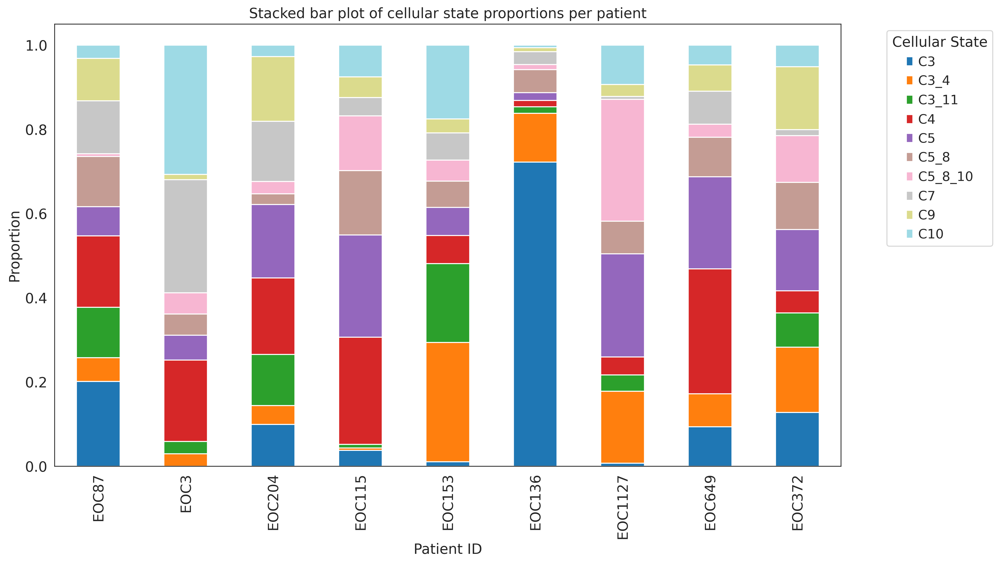

In [151]:
df = adata_EOC.obs[['sample', 'patient_id', 'anatomical_location', 'status', 'SBS3', 'cellular_state']]

cellular_state_proportions = (
    df.groupby(['patient_id', 'cellular_state'])
    .size()
    .unstack(fill_value=0)
    .apply(lambda x: x / x.sum(), axis=1)
)

cellular_state_proportions = cellular_state_proportions.reindex(patients_ordered)

cellular_state_proportions.plot(kind='bar', stacked=True, figsize=(14, 8), colormap="tab20", )

plt.title('Stacked bar plot of cellular state proportions per patient')
plt.ylabel('Proportion')
plt.xlabel('Patient ID')
plt.legend(title='Cellular State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(False)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Barplot_cellulerstates_EOC.pdf",
#                                  dpi=600, bbox_inches='tight')

plt.show()

In [152]:
cellular_state_counts = adata_EOC.obs.groupby(['patient_id', 'status', 'cellular_state']).size().reset_index(name='count')
total_counts_per_patient = adata_EOC.obs.groupby(['patient_id', 'status']).size().reset_index(name='total_count')
merged_df = pd.merge(cellular_state_counts, total_counts_per_patient, on=['patient_id', 'status'])
merged_df['proportion'] = merged_df['count'] / merged_df['total_count']
melted_df = merged_df[['patient_id', 'status', 'cellular_state', 'proportion']]

In [164]:
p_values = {}

for state in melted_df['cellular_state'].unique():
    # print(state)
    responsive = melted_df[(melted_df['cellular_state'] == state) &\
                           (melted_df['status'] == 'Sensitive')]['proportion'].dropna()
    refractory = melted_df[(melted_df['cellular_state'] == state) &\
                           (melted_df['status'] == 'Refractory')]['proportion'].dropna()
    
    t_stat, p_val = ttest_ind(responsive, refractory, equal_var=True)
    
    p_values[state] = p_val

In [165]:
p_values

{'C3': 0.5156608561827178,
 'C3_4': 0.016653923428116064,
 'C3_11': 0.9131715384850264,
 'C4': 0.12562637677987432,
 'C5': 0.9685460275520641,
 'C5_8': 0.8142881693443633,
 'C5_8_10': 0.4931202538530981,
 'C7': 0.04588957603308943,
 'C9': 0.5808829964630706,
 'C10': 0.6108054154655858}

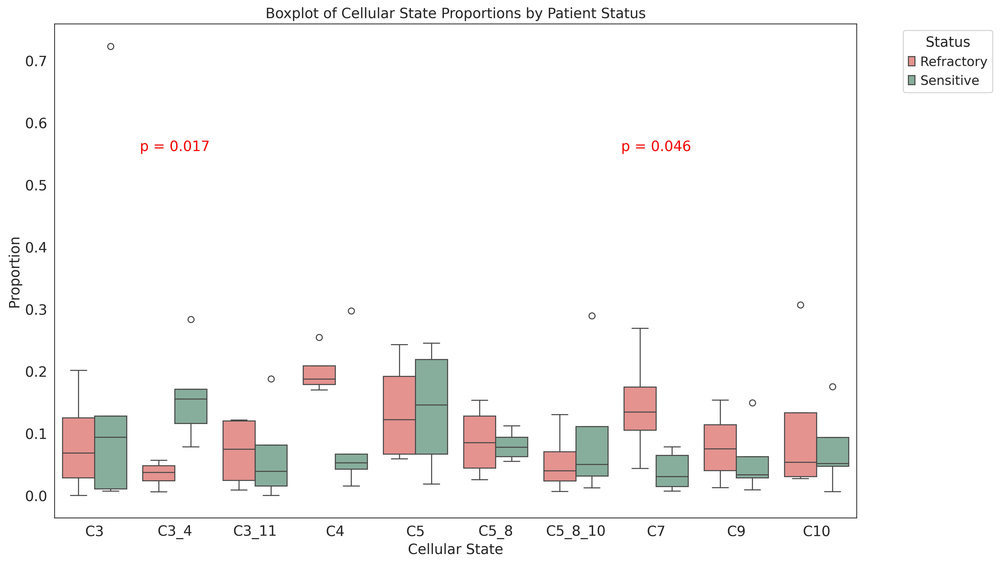

In [167]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='cellular_state', y='proportion',
            hue='status', data=melted_df,
            palette=status_palette)

plt.title('Boxplot of Cellular State Proportions by Patient Status')
plt.ylabel('Proportion')
plt.xlabel('Cellular State')
plt.legend(title='Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)

for state, p_val in p_values.items():
    if p_val < 0.1: 
        plt.text(
            x=melted_df['cellular_state'].unique().tolist().index(state), 
            y=0.55, 
            s=f'p = {p_val:.3f}', 
            ha='center', 
            va='bottom', 
            color='red'
        )

plt.tight_layout()
plt.grid(False)

# plt.savefig(\
#             "/mnt/storageBig8/work/afenteda/ChemoRef/PAPER_v3_CRM/plots/Baxplots_cellulerstates_EOC.pdf",
#                                  dpi=600, bbox_inches='tight')

plt.show()

In [171]:
adata_EOC.obs['HALLMARK_IFN_ALPHA_RESPONSE'] = acts_EOC_msigdb.obs['HALLMARK_IFN_ALPHA_RESPONSE'].values

<Axes: xlabel='cellular_state', ylabel='HALLMARK_IFN_ALPHA_RESPONSE'>

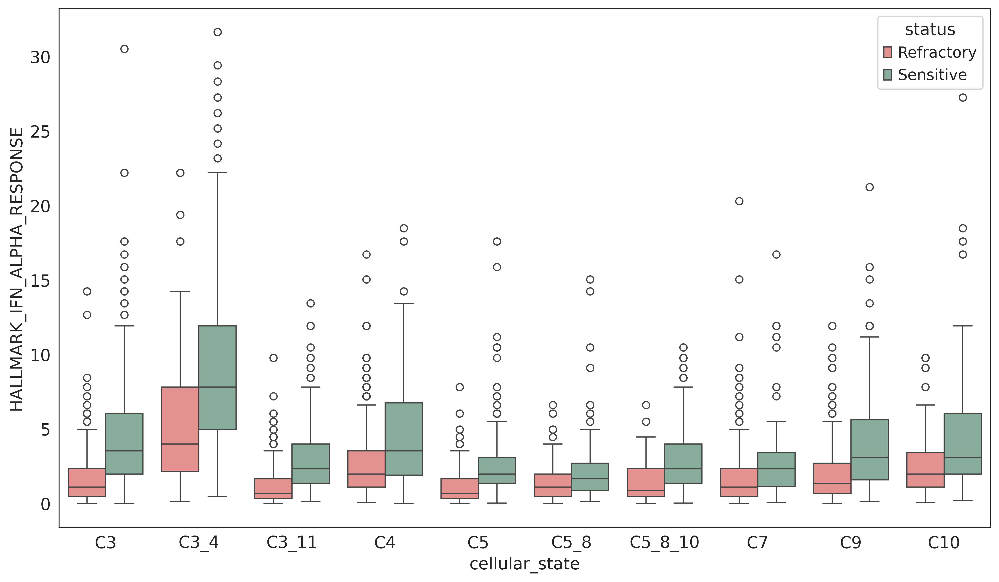

In [175]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='cellular_state', y='HALLMARK_IFN_ALPHA_RESPONSE',
            hue='status', data=adata_EOC.obs,
            palette=status_palette)